## Import library and CSV file

In [1]:
# Needed Libraries
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import *
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import LabelEncoder
from matplotlib import pyplot as plt
from scipy.stats import linregress
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression
import seaborn as sns
import math
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.neural_network import MLPRegressor
from sklearn.linear_model import LinearRegression
from sklearn import tree
from sklearn.ensemble import RandomForestRegressor
from sklearn import preprocessing
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from xgboost import XGBRegressor
from tabulate import tabulate
import statsmodels.api as sm
import sklearn.tree as tree
from sklearn.tree import DecisionTreeRegressor, export_text
from sklearn.tree import export_text

In [2]:
!pip install -U dmba;
from dmba import regressionSummary

Colab environment detected.


In [3]:
%%capture
!pip install dtreeviz
import dtreeviz

In [4]:
!git clone https://github.com/deannasoukhaseum/Data_Analysis_Portfolio.git
file_path = "Data_Analysis_Portfolio/Predicting_Academic_Success/Test_Scores_Dataset.csv"
df = pd.read_csv(file_path)
df.head()

fatal: destination path 'Data_Analysis_Portfolio' already exists and is not an empty directory.


,school,school_setting,school_type,classroom,teaching_method,n_student,student_id,gender,lunch,pretest,posttest
0,ANKYI,Urban,Non-public,6OL,Standard,20.0,2FHT3,Female,Does not qualify,62.0,72.0
1,ANKYI,Urban,Non-public,6OL,Standard,20.0,3JIVH,Female,Does not qualify,66.0,79.0
2,ANKYI,Urban,Non-public,6OL,Standard,20.0,3XOWE,Male,Does not qualify,64.0,76.0
3,ANKYI,Urban,Non-public,6OL,Standard,20.0,556O0,Female,Does not qualify,61.0,77.0
4,ANKYI,Urban,Non-public,6OL,Standard,20.0,74LOE,Male,Does not qualify,64.0,76.0


##Data Cleaning

In [5]:
df = df.drop(columns=["school", "classroom", "student_id"])

In [6]:
df.head()

,school_setting,school_type,teaching_method,n_student,gender,lunch,pretest,posttest
0,Urban,Non-public,Standard,20.0,Female,Does not qualify,62.0,72.0
1,Urban,Non-public,Standard,20.0,Female,Does not qualify,66.0,79.0
2,Urban,Non-public,Standard,20.0,Male,Does not qualify,64.0,76.0
3,Urban,Non-public,Standard,20.0,Female,Does not qualify,61.0,77.0
4,Urban,Non-public,Standard,20.0,Male,Does not qualify,64.0,76.0


In [7]:
print("Missing values per column BEFORE cleaning:")
print(df.isnull().sum())

Missing values per column BEFORE cleaning:
school_setting     0
school_type        0
teaching_method    0
n_student          0
gender             0
lunch              0
pretest            0
posttest           0
dtype: int64


In [8]:
# Checks for duplicate entries
df.duplicated().sum()

np.int64(108)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2133 entries, 0 to 2132
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   school_setting   2133 non-null   object 
 1   school_type      2133 non-null   object 
 2   teaching_method  2133 non-null   object 
 3   n_student        2133 non-null   float64
 4   gender           2133 non-null   object 
 5   lunch            2133 non-null   object 
 6   pretest          2133 non-null   float64
 7   posttest         2133 non-null   float64
dtypes: float64(3), object(5)
memory usage: 133.4+ KB


In [10]:
#For future df that requires encoded part
df_encoded = pd.get_dummies(df, drop_first=False)

In [11]:
df_encoded.describe()

,n_student,pretest,posttest
count,2133.000000,2133.000000,2133.000000
mean,22.796531,54.955931,67.102203
std,4.228893,13.563101,13.986789
min,14.000000,22.000000,32.000000
25%,20.000000,44.000000,56.000000
50%,22.000000,56.000000,68.000000
75%,27.000000,65.000000,77.000000
max,31.000000,93.000000,100.000000


In [12]:
correlation_matrix = df_encoded.corr()
correlation_matrix

,n_student,pretest,posttest,school_setting_Rural,school_setting_Suburban,school_setting_Urban,school_type_Non-public,school_type_Public,teaching_method_Experimental,teaching_method_Standard,gender_Female,gender_Male,lunch_Does not qualify,lunch_Qualifies for reduced/free lunch
n_student,1.000000,-0.499253,-0.504886,-0.368704,-0.187348,0.497194,-0.548190,0.548190,-0.105900,0.105900,0.019265,-0.019265,-0.367018,0.367018
pretest,-0.499253,1.000000,0.950884,-0.143273,0.466264,-0.321962,0.361158,-0.361158,0.115185,-0.115185,-0.006048,0.006048,0.622420,-0.622420
posttest,-0.504886,0.950884,1.000000,-0.122316,0.454704,-0.328997,0.373916,-0.373916,0.312884,-0.312884,-0.006902,0.006902,0.598371,-0.598371
school_setting_Rural,-0.368704,-0.143273,-0.122316,1.000000,-0.398891,-0.481690,-0.087246,0.087246,0.044259,-0.044259,-0.049441,0.049441,-0.045522,0.045522
school_setting_Suburban,-0.187348,0.466264,0.454704,-0.398891,1.000000,-0.611462,0.017648,-0.017648,0.059121,-0.059121,0.027849,-0.027849,0.125442,-0.125442
school_setting_Urban,0.497194,-0.321962,-0.328997,-0.481690,-0.611462,1.000000,0.058419,-0.058419,-0.094691,0.094691,0.016048,-0.016048,-0.080599,0.080599
school_type_Non-public,-0.548190,0.361158,0.373916,-0.087246,0.017648,0.058419,1.000000,-1.000000,0.153593,-0.153593,0.017593,-0.017593,0.171196,-0.171196
school_type_Public,0.548190,-0.361158,-0.373916,0.087246,-0.017648,-0.058419,-1.000000,1.000000,-0.153593,0.153593,-0.017593,0.017593,-0.171196,0.171196
teaching_method_Experimental,-0.105900,0.115185,0.312884,0.044259,0.059121,-0.094691,0.153593,-0.153593,1.000000,-1.000000,-0.020087,0.020087,0.017970,-0.017970
teaching_method_Standard,0.105900,-0.115185,-0.312884,-0.044259,-0.059121,0.094691,-0.153593,0.153593,-1.000000,1.000000,0.020087,-0.020087,-0.017970,0.017970


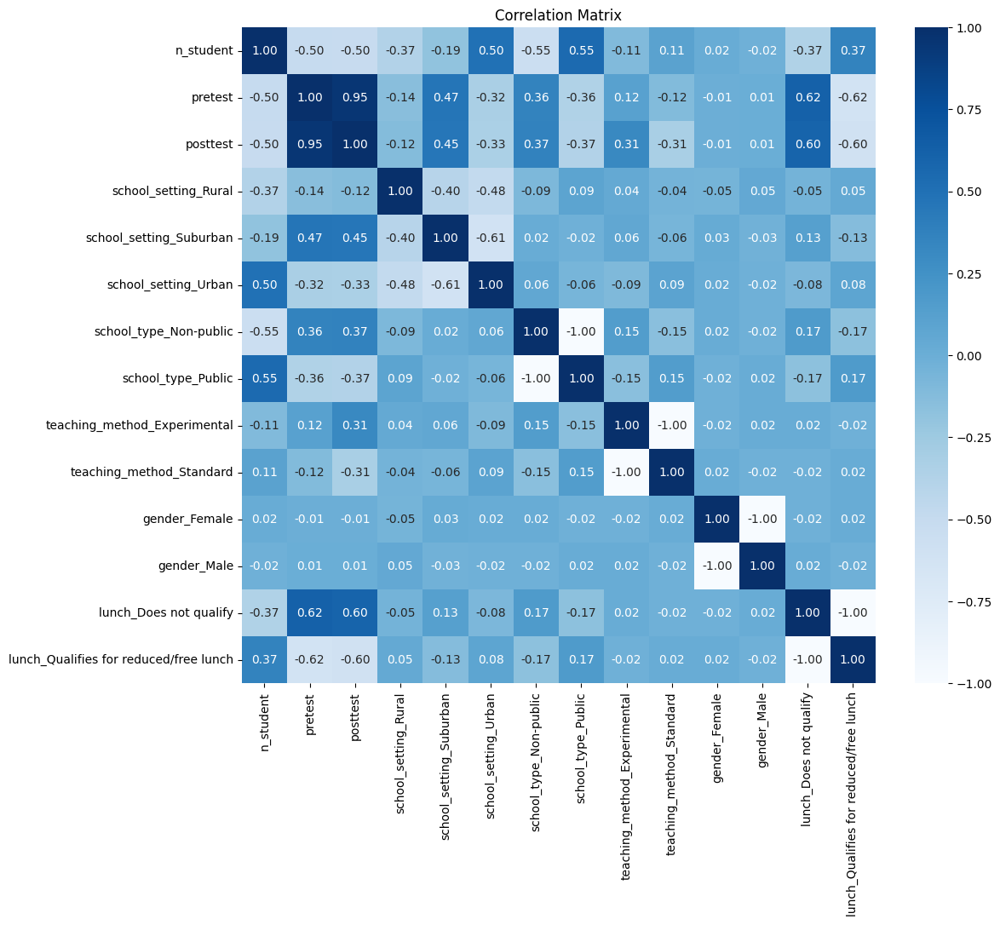

In [13]:
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='Blues', fmt=".2f")
plt.title("Correlation Matrix")
plt.savefig('corr.png', transparent=True)

#Pretest, Posttest ==> Correlation Coefficient is 0.95

In [14]:
df_encoded.head()

,n_student,pretest,posttest,school_setting_Rural,school_setting_Suburban,school_setting_Urban,school_type_Non-public,school_type_Public,teaching_method_Experimental,teaching_method_Standard,gender_Female,gender_Male,lunch_Does not qualify,lunch_Qualifies for reduced/free lunch
0,20.0,62.0,72.0,False,False,True,True,False,False,True,True,False,True,False
1,20.0,66.0,79.0,False,False,True,True,False,False,True,True,False,True,False
2,20.0,64.0,76.0,False,False,True,True,False,False,True,False,True,True,False
3,20.0,61.0,77.0,False,False,True,True,False,False,True,True,False,True,False
4,20.0,64.0,76.0,False,False,True,True,False,False,True,False,True,True,False


## EDA

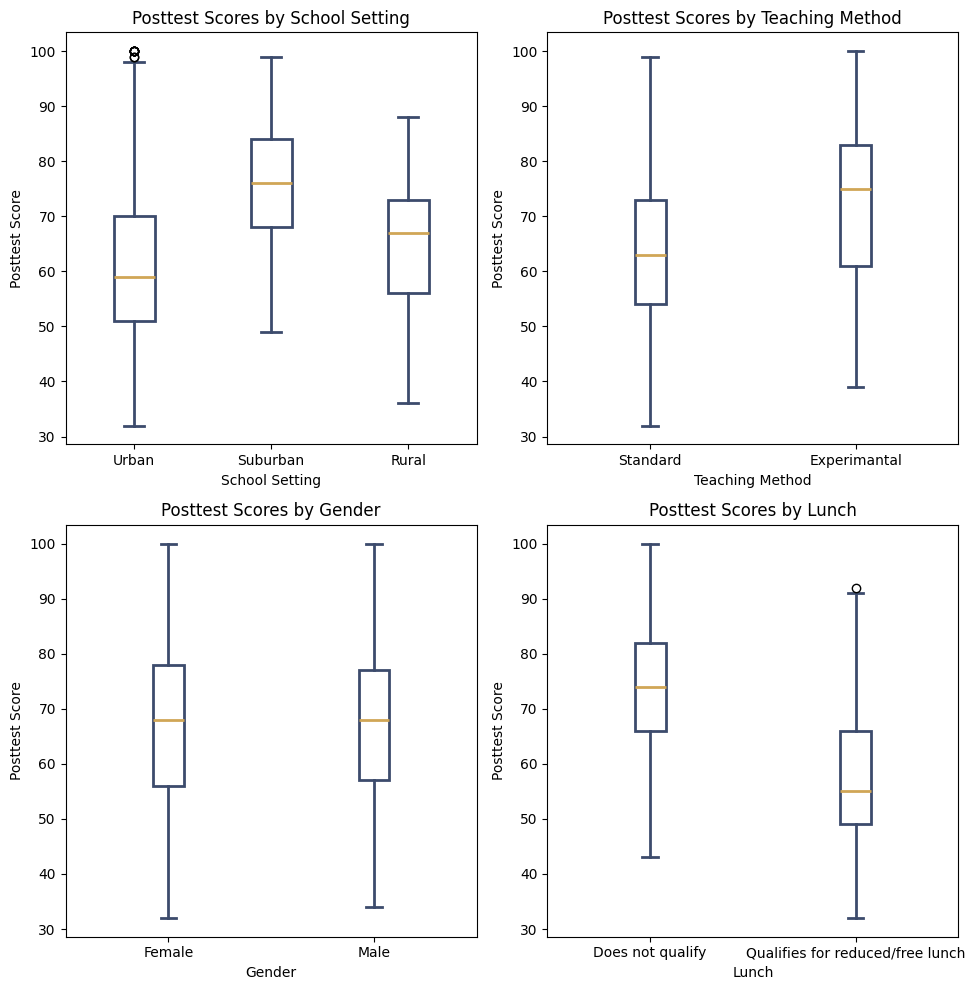

In [15]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))

axes[0][0].boxplot(
    [df.loc[df['school_setting'] == setting, 'posttest'] for setting in df['school_setting'].unique()],
    patch_artist=True,
    boxprops=dict(facecolor='none', color='#3c4b6cff', linewidth=2),
    medianprops=dict(color='#d0a656ff', linewidth=2),
    whiskerprops=dict(color='#3c4b6cff', linewidth=2),
    capprops=dict(color='#3c4b6cff', linewidth=2),
    flierprops=dict(color='#3c4b6cff', linewidth=2)
)

axes[0][0].set_title('Posttest Scores by School Setting')
axes[0][0].set_xlabel('School Setting')
axes[0][0].set_ylabel('Posttest Score')
axes[0][0].set_xticklabels(df['school_setting'].unique())

axes[0][1].boxplot(
    [df.loc[df['teaching_method'] == method, 'posttest'] for method in df['teaching_method'].unique()],
    patch_artist=True,
    boxprops=dict(facecolor='none', color='#3c4b6cff', linewidth=2),
    medianprops=dict(color='#d0a656ff', linewidth=2),
    whiskerprops=dict(color='#3c4b6cff', linewidth=2),
    capprops=dict(color='#3c4b6cff', linewidth=2),
    flierprops=dict(color='#3c4b6cff', linewidth=2)
)
axes[0][1].set_title('Posttest Scores by Teaching Method')
axes[0][1].set_xlabel('Teaching Method')
axes[0][1].set_xticklabels(['Standard', 'Experimantal'])
axes[0][1].set_ylabel('Posttest Score')

axes[1][0].boxplot(
    [df.loc[df['gender'] == gender, 'posttest'] for gender in df['gender'].unique()],
    patch_artist=True,
    boxprops=dict(facecolor='none', color='#3c4b6cff', linewidth=2),
    medianprops=dict(color='#d0a656ff', linewidth=2),
    whiskerprops=dict(color='#3c4b6cff', linewidth=2),
    capprops=dict(color='#3c4b6cff', linewidth=2),
    flierprops=dict(color='#3c4b6cff', linewidth=2)
)

axes[1][0].set_title('Posttest Scores by Gender')
axes[1][0].set_xlabel('Gender')
axes[1][0].set_xticklabels(['Female', 'Male'])
axes[1][0].set_ylabel('Posttest Score')


axes[1][1].boxplot(
    [df.loc[df['lunch'] == lunch, 'posttest'] for lunch in df['lunch'].unique()],
    patch_artist=True,
    boxprops=dict(facecolor='none', color='#3c4b6cff', linewidth=2),
    medianprops=dict(color='#d0a656ff', linewidth=2),
    whiskerprops=dict(color='#3c4b6cff', linewidth=2),
    capprops=dict(color='#3c4b6cff', linewidth=2),
    flierprops=dict(color='#3c4b6cff', linewidth=2)
)
axes[1][1].set_title('Posttest Scores by Lunch')
axes[1][1].set_xlabel('Lunch')
axes[1][1].set_xticklabels(['Does not qualify', 'Qualifies for reduced/free lunch'])
axes[1][1].set_ylabel('Posttest Score')

plt.tight_layout()
plt.savefig('boxplots.png', transparent=True)

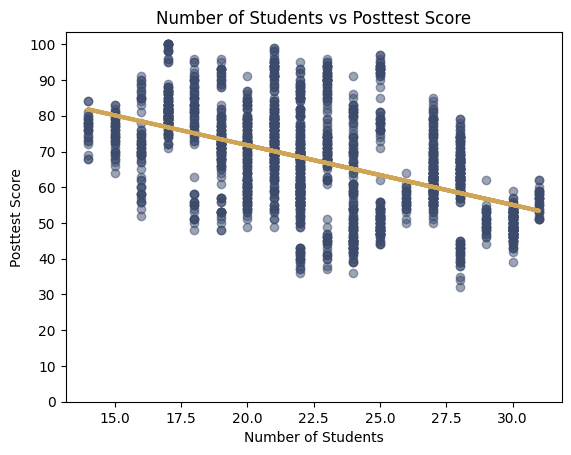

In [16]:
x_students = df['n_student']
y_posttest = df['posttest']

slope_post, intercept_post, _, _, _ = linregress(x_students, y_posttest)

plt.scatter(x_students, y_posttest, alpha=0.5, c='#3c4b6cff')
plt.plot(x_students, slope_post * x_students + intercept_post, color='#d0a656ff', linewidth=3)
plt.title('Number of Students vs Posttest Score')
plt.xlabel('Number of Students')
plt.ylabel('Posttest Score')
plt.yticks(range(0, 101, 10))

plt.savefig('scatter1.png', transparent=True)

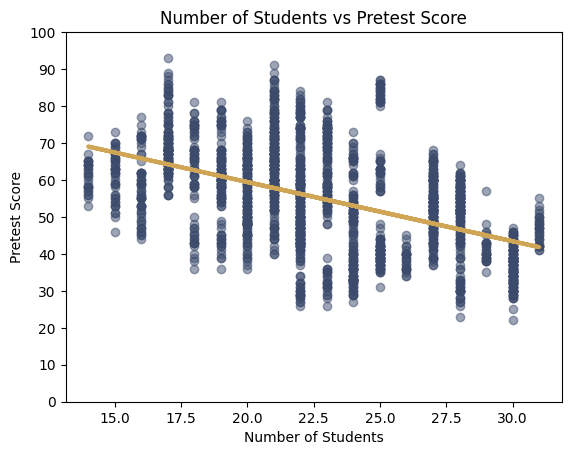

In [17]:
y_pretest = df['pretest']

slope_pre, intercept_pre, _, _, _ = linregress(x_students, y_pretest)

# Plot n and pretest
plt.scatter(x_students, y_pretest, alpha=0.5, c='#3c4b6cff')
plt.plot(x_students, slope_pre * x_students + intercept_pre, color='#d0a656ff', linewidth=3)
plt.title('Number of Students vs Pretest Score')
plt.xlabel('Number of Students')
plt.ylabel('Pretest Score')
plt.yticks(range(0, 101, 10))

plt.savefig('scatter2.png', transparent=True)

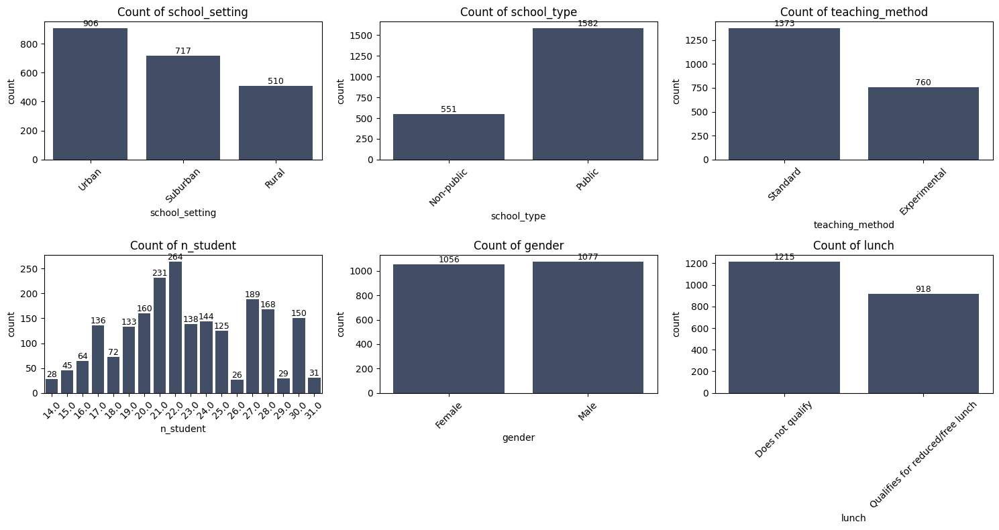

In [18]:
count_cols = [col for col in df.columns if df[col].dtype == 'object' or df[col].nunique() < 20]

n_cols = 3
n_rows = math.ceil(len(count_cols) / n_cols)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
axes = axes.flatten()

for i, col in enumerate(count_cols):
    ax = axes[i]
    plot = sns.countplot(data=df, x=col, ax=ax, color='#3c4b6cff')
    ax.set_title(f'Count of {col}')
    ax.tick_params(axis='x', rotation=45)
    for container in ax.containers:
        ax.bar_label(container, label_type='edge', fontsize=9)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.savefig('barcharts.png', transparent=True)

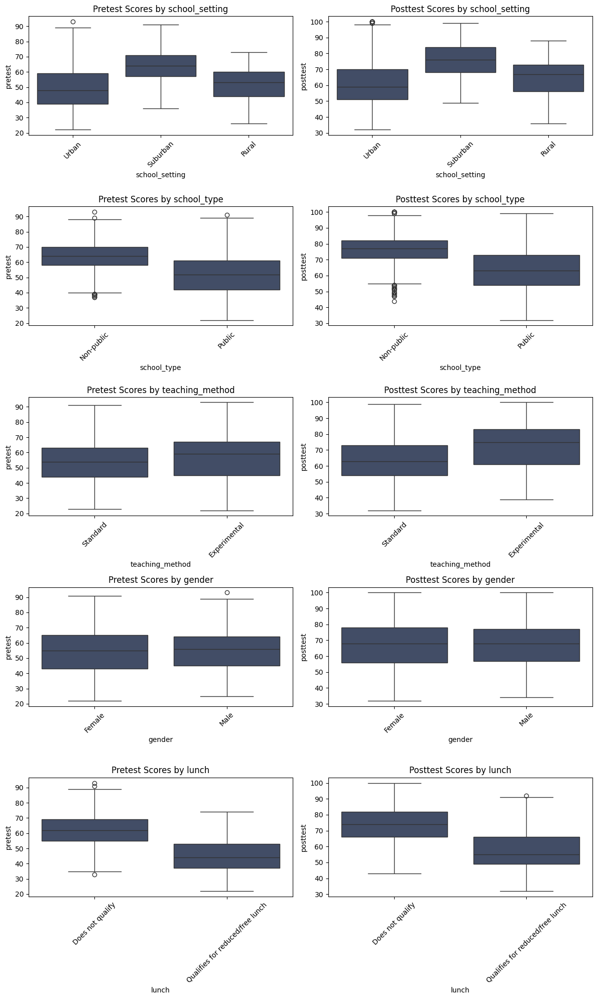

In [19]:
#how the variables affect the pretest and posttest scores?
comparison_vars = [col for col in df.columns if col not in ['pretest', 'posttest']]
group_vars = [col for col in comparison_vars if df[col].dtype == 'object' or df[col].nunique() < 10]

n_cols = 2
n_rows = len(group_vars)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 4 * n_rows))

for i, col in enumerate(group_vars):
    sns.boxplot(data=df, x=col, y='pretest', ax=axes[i][0], color='#3c4b6cff')
    axes[i][0].set_title(f'Pretest Scores by {col}')
    axes[i][0].tick_params(axis='x', rotation=45)
    sns.boxplot(data=df, x=col, y='posttest', ax=axes[i][1], color='#3c4b6cff')
    axes[i][1].set_title(f'Posttest Scores by {col}')
    axes[i][1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

# PCA

In [20]:
#When the target_col is 'posttest'
target_col = "posttest"

X = df_encoded.drop(target_col, axis=1)
y = df_encoded[target_col]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state = 42)
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

print("\nFirst few rows of X_train:")
print(X_train.head())
print("\nFirst few rows of y_train:")
print(y_train.head())

model = LinearRegression()
model.fit(X_train, y_train)

coef_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Coefficient': model.coef_
}).sort_values(by='Coefficient', key=abs, ascending=False)
print("\nFeature Coefficients:")
print(coef_df.to_string(index=False))

X_train shape: (1279, 13)
X_test shape: (854, 13)
y_train shape: (1279,)
y_test shape: (854,)

First few rows of X_train:
      n_student  pretest  school_setting_Rural  school_setting_Suburban  \
1573       23.0     72.0                 False                     True   
1898       25.0     40.0                 False                    False   
1435       21.0     58.0                 False                     True   
1288       22.0     55.0                 False                    False   
1963       24.0     67.0                 False                     True   

      school_setting_Urban  school_type_Non-public  school_type_Public  \
1573                 False                   False                True   
1898                  True                   False                True   
1435                 False                   False                True   
1288                  True                   False                True   
1963                 False                   False       

In [21]:
#SCALING

numeric_cols = X_train.select_dtypes(include=['int64', 'float64']).columns

scaler = StandardScaler()
X_train_scaled = X_train.copy()
X_test_scaled = X_test.copy()

X_train_scaled[numeric_cols] = scaler.fit_transform(X_train[numeric_cols])
X_test_scaled[numeric_cols] = scaler.transform(X_test[numeric_cols])

coef_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Coefficient': model.coef_
}).sort_values(by='Coefficient', key=abs, ascending=False)
print("\nFeature Coefficients:")
print(coef_df.to_string(index=False))

print("Scaled X_train:")
print(X_train_scaled.head())


Feature Coefficients:
                               Feature  Coefficient
              teaching_method_Standard    -3.049615
          teaching_method_Experimental     3.049615
                               pretest     0.918465
                lunch_Does not qualify     0.359156
lunch_Qualifies for reduced/free lunch    -0.359156
               school_setting_Suburban     0.320402
                  school_setting_Urban    -0.172831
                  school_setting_Rural    -0.147571
                             n_student    -0.077433
                         gender_Female     0.067068
                           gender_Male    -0.067068
                    school_type_Public     0.013703
                school_type_Non-public    -0.013703
Scaled X_train:
      n_student   pretest  school_setting_Rural  school_setting_Suburban  \
1573   0.049268  1.263025                 False                     True   
1898   0.526645 -1.118486                 False                    False   
1435 

In [22]:
pcs = PCA(n_components=7)

pcs.fit(df_encoded)

PCA(n_components=7)

In [23]:
print(pcs.explained_variance_ratio_.round(3))

print(np.cumsum(pcs.explained_variance_ratio_).round(3))

[0.939 0.033 0.024 0.001 0.001 0.001 0.001]
[0.939 0.972 0.996 0.997 0.998 0.999 0.999]


In [24]:
pcsSummary_df = pd.DataFrame({
    "& of variance explained:": pcs.explained_variance_ratio_,
    "Cumulative % explained:": np.cumsum(pcs.explained_variance_ratio_)
})

pcsSummary_df.round(3)

,& of variance explained:,Cumulative % explained:
0,0.939,0.939
1,0.033,0.972
2,0.024,0.996
3,0.001,0.997
4,0.001,0.998
5,0.001,0.999
6,0.001,0.999


In [25]:
pcs.components_.round(3)

array([[-0.115,  0.691,  0.713, -0.003,  0.011, -0.009,  0.009, -0.009,
         0.005, -0.005, -0.   ,  0.   ,  0.016, -0.016],
       [ 0.986,  0.119,  0.046, -0.061,  0.009,  0.051, -0.05 ,  0.05 ,
        -0.002,  0.002,  0.003, -0.003, -0.006,  0.006],
       [-0.054,  0.706, -0.691, -0.005,  0.006, -0.   , -0.002,  0.002,
        -0.101,  0.101,  0.   , -0.   ,  0.014, -0.014],
       [ 0.004,  0.003, -0.002,  0.058, -0.028, -0.03 , -0.056,  0.056,
         0.017, -0.017, -0.702,  0.702,  0.027, -0.027],
       [ 0.004, -0.004, -0.002, -0.197, -0.411,  0.608,  0.407, -0.407,
         0.006, -0.006, -0.037,  0.037,  0.211, -0.211],
       [ 0.01 ,  0.05 , -0.038, -0.189,  0.192, -0.003,  0.329, -0.329,
         0.227, -0.227, -0.053,  0.053, -0.547,  0.547],
       [-0.012, -0.088,  0.088, -0.338,  0.307,  0.031,  0.099, -0.099,
        -0.607,  0.607, -0.047,  0.047, -0.083,  0.083]])

In [26]:
pcs_df = pd.DataFrame(pcs.components_).round(2).transpose()
pcs_df

,0,1,2,3,4,5,6
0,-0.12,0.99,-0.05,0.00,0.00,0.01,-0.01
1,0.69,0.12,0.71,0.00,-0.00,0.05,-0.09
2,0.71,0.05,-0.69,-0.00,-0.00,-0.04,0.09
3,-0.00,-0.06,-0.01,0.06,-0.20,-0.19,-0.34
4,0.01,0.01,0.01,-0.03,-0.41,0.19,0.31
5,-0.01,0.05,-0.00,-0.03,0.61,-0.00,0.03
6,0.01,-0.05,-0.00,-0.06,0.41,0.33,0.10
7,-0.01,0.05,0.00,0.06,-0.41,-0.33,-0.10
8,0.01,-0.00,-0.10,0.02,0.01,0.23,-0.61
9,-0.01,0.00,0.10,-0.02,-0.01,-0.23,0.61


In [27]:
var = list(df_encoded.columns)
print(var)

['n_student', 'pretest', 'posttest', 'school_setting_Rural', 'school_setting_Suburban', 'school_setting_Urban', 'school_type_Non-public', 'school_type_Public', 'teaching_method_Experimental', 'teaching_method_Standard', 'gender_Female', 'gender_Male', 'lunch_Does not qualify', 'lunch_Qualifies for reduced/free lunch']


In [28]:
pcs_df.index = [var]
pcs_df

,0,1,2,3,4,5,6
n_student,-0.12,0.99,-0.05,0.00,0.00,0.01,-0.01
pretest,0.69,0.12,0.71,0.00,-0.00,0.05,-0.09
posttest,0.71,0.05,-0.69,-0.00,-0.00,-0.04,0.09
school_setting_Rural,-0.00,-0.06,-0.01,0.06,-0.20,-0.19,-0.34
school_setting_Suburban,0.01,0.01,0.01,-0.03,-0.41,0.19,0.31
school_setting_Urban,-0.01,0.05,-0.00,-0.03,0.61,-0.00,0.03
school_type_Non-public,0.01,-0.05,-0.00,-0.06,0.41,0.33,0.10
school_type_Public,-0.01,0.05,0.00,0.06,-0.41,-0.33,-0.10
teaching_method_Experimental,0.01,-0.00,-0.10,0.02,0.01,0.23,-0.61
teaching_method_Standard,-0.01,0.00,0.10,-0.02,-0.01,-0.23,0.61


In [29]:
scaled_array = preprocessing.scale(df_encoded)
print(scaled_array)

[[-0.66144654  0.51947714  0.35025516 ... -1.00989423  0.86922699
  -0.86922699]
 [-0.66144654  0.8144641   0.85084479 ... -1.00989423  0.86922699
  -0.86922699]
 [-0.66144654  0.66697062  0.63630638 ...  0.9902027   0.86922699
  -0.86922699]
 ...
 [ 1.70379314 -0.73421741 -1.15151373 ... -1.00989423 -1.15044748
   1.15044748]
 [ 1.70379314 -0.66047067 -1.00848812 ...  0.9902027  -1.15044748
   1.15044748]
 [ 1.70379314 -1.02920437 -1.36605214 ...  0.9902027  -1.15044748
   1.15044748]]


In [30]:
scaled_df = pd.DataFrame(scaled_array)
print(scaled_df)

            0         1         2         3         4         5         6   \
0    -0.661447  0.519477  0.350255 -0.560565 -0.711587  1.163746  1.694445   
1    -0.661447  0.814464  0.850845 -0.560565 -0.711587  1.163746  1.694445   
2    -0.661447  0.666971  0.636306 -0.560565 -0.711587  1.163746  1.694445   
3    -0.661447  0.445730  0.707819 -0.560565 -0.711587  1.163746  1.694445   
4    -0.661447  0.666971  0.636306 -0.560565 -0.711587  1.163746  1.694445   
...        ...       ...       ...       ...       ...       ...       ...   
2128  1.703793 -1.176698 -0.865463 -0.560565 -0.711587  1.163746 -0.590164   
2129  1.703793 -1.250445 -1.509078 -0.560565 -0.711587  1.163746 -0.590164   
2130  1.703793 -0.734217 -1.151514 -0.560565 -0.711587  1.163746 -0.590164   
2131  1.703793 -0.660471 -1.008488 -0.560565 -0.711587  1.163746 -0.590164   
2132  1.703793 -1.029204 -1.366052 -0.560565 -0.711587  1.163746 -0.590164   

            7         8         9         10        11        1

In [31]:
pd.DataFrame({
              'mean':scaled_df.mean(),
              'stdev': scaled_df.std()
              }).transpose().round(3)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13
mean,-0.0,0.0,-0.0,0.0,0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0,-0.0,0.0
stdev,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [32]:
pcs = PCA(n_components=7)
pcs.fit(scaled_df)

# view the importance of principal components
pcsSummary_df = pd.DataFrame({
            'Proportion of variance': pcs.explained_variance_ratio_,
            'Cumulative proportion': np.cumsum(pcs.explained_variance_ratio_)
            })
pcsSummary_df.transpose().round(3)

,0,1,2,3,4,5,6
Proportion of variance,0.309,0.148,0.145,0.132,0.118,0.099,0.031
Cumulative proportion,0.309,0.457,0.602,0.734,0.852,0.951,0.982


In [33]:
pd.DataFrame(pcs.components_.transpose(), index=[var]).round(2)

,0,1,2,3,4,5,6
n_student,-0.34,-0.07,-0.01,-0.04,-0.44,0.01,0.13
pretest,0.42,-0.15,0.06,-0.05,-0.09,0.08,0.55
posttest,0.43,-0.04,0.02,-0.10,-0.14,0.04,0.51
school_setting_Rural,-0.01,0.16,0.12,-0.16,0.60,-0.42,0.17
school_setting_Suburban,0.21,-0.14,0.06,-0.36,-0.11,0.58,-0.34
school_setting_Urban,-0.19,-0.01,-0.17,0.48,-0.41,-0.19,0.18
school_type_Non-public,0.28,0.19,-0.24,0.44,0.16,0.18,-0.11
school_type_Public,-0.28,-0.19,0.24,-0.44,-0.16,-0.18,0.11
teaching_method_Experimental,0.15,0.53,-0.14,-0.25,-0.26,-0.17,-0.09
teaching_method_Standard,-0.15,-0.53,0.14,0.25,0.26,0.17,0.09


In [34]:
eig=pcs.explained_variance_.round(2)
print(eig)

[4.33 2.07 2.02 1.85 1.65 1.39 0.43]


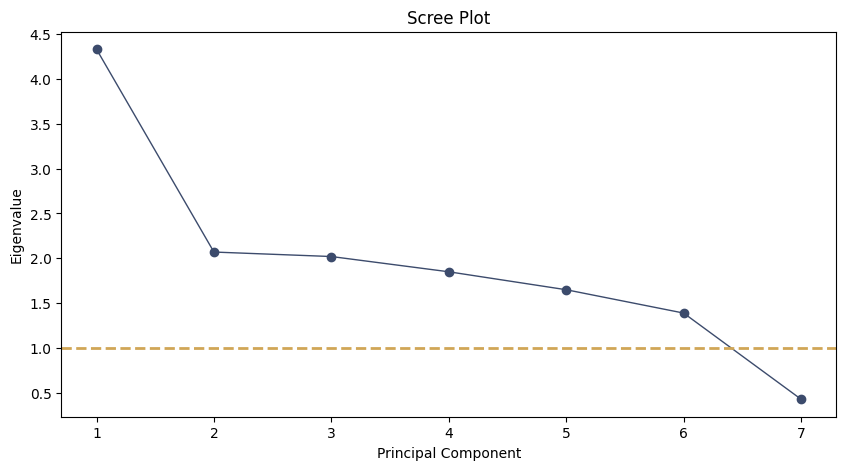

In [35]:
# define the x values, which is a simple array between 1 and 12
xvals = np.arange(1,8,step=1);
plt.figure(figsize=(10,5))
plt.plot(xvals, eig, marker='o', linestyle='-', color = '#3c4b6cff', linewidth=1)
plt.xticks(xvals)

plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Eigenvalue')
plt.axhline(y=1, color='#d0a656ff',  linewidth=2, linestyle='--')
plt.savefig('scree.png', transparent=True)

In [36]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

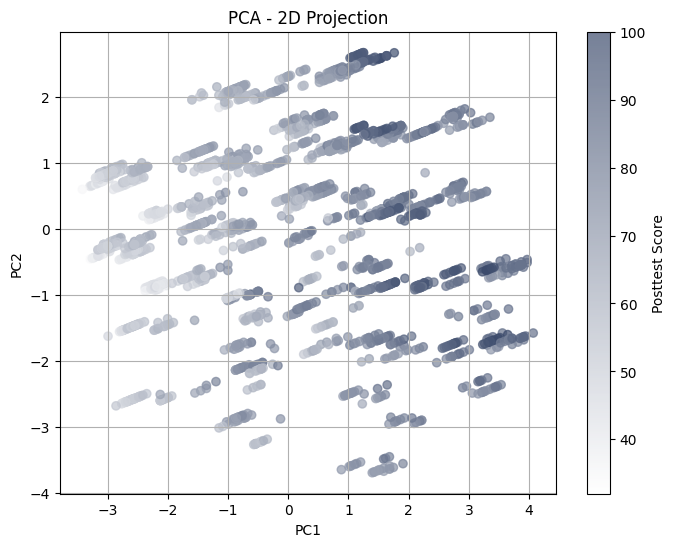

In [37]:
from matplotlib.colors import LinearSegmentedColormap
pca_graph = PCA(n_components=7)
X_pca_graph = pca_graph.fit_transform(X_scaled)

my_cmap = LinearSegmentedColormap.from_list("my_cmap", ['#ffffff', '#3c4b6cff'])

plt.figure(figsize=(8, 6))
plt.scatter(X_pca_graph[:, 0], X_pca_graph[:, 1], c = df['posttest'], cmap = my_cmap, alpha=0.7)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA - 2D Projection')
plt.colorbar(label='Posttest Score')
plt.grid(True)
plt.show()

#Now need some color code or labels so that readers can interpret better
##RESOLVED

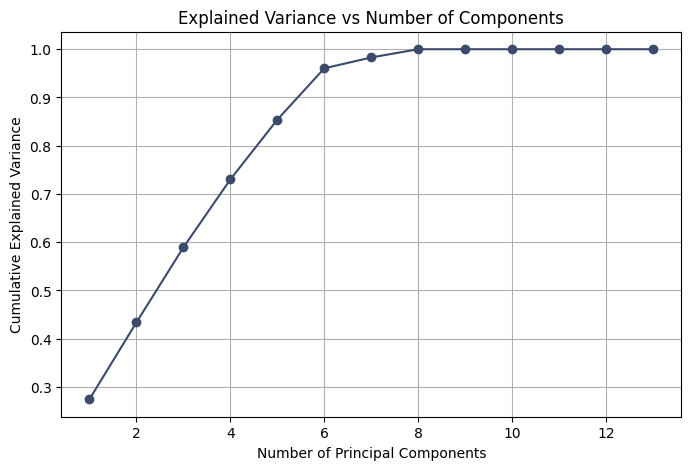

In [38]:
pca_degree = PCA()
X_pca_degree = pca_degree.fit_transform(X_scaled)

cum_var_exp = np.cumsum(pca_degree.explained_variance_ratio_)

plt.figure(figsize=(8,5))
plt.plot(range(1, len(cum_var_exp) + 1), cum_var_exp, marker='o', c = '#3c4b6cff')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance vs Number of Components')
plt.grid(True)
plt.savefig('pca.png', transparent=True)

# Linear Regression



In [39]:
y_pred_naive = [y_train.mean()] * len(y_test)
#y_pred_naive = np.full_like(y_test, y_train.mean())
rmse_naive = np.sqrt(mean_squared_error(y_test, y_pred_naive))
#r2_naive = r2_score(y_test, y_pred_naive)
print("Naive Baseline RMSE:", rmse_naive)

Naive Baseline RMSE: 14.20919721438681


In [40]:
df = pd.get_dummies(df, drop_first=True)
X = df.drop(columns=["posttest"])
y = df["posttest"]

cat_features = X.select_dtypes(include=["object"]).columns.tolist()
num_features = X.select_dtypes(include=["int64", "float64"]).columns.tolist()

preprocessor = ColumnTransformer(transformers=[
    ('num', StandardScaler(), num_features),
    ('cat', OneHotEncoder(handle_unknown='ignore'), cat_features)],
    remainder='passthrough'
)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)
results = {}


RMSE: 3.240444801808999


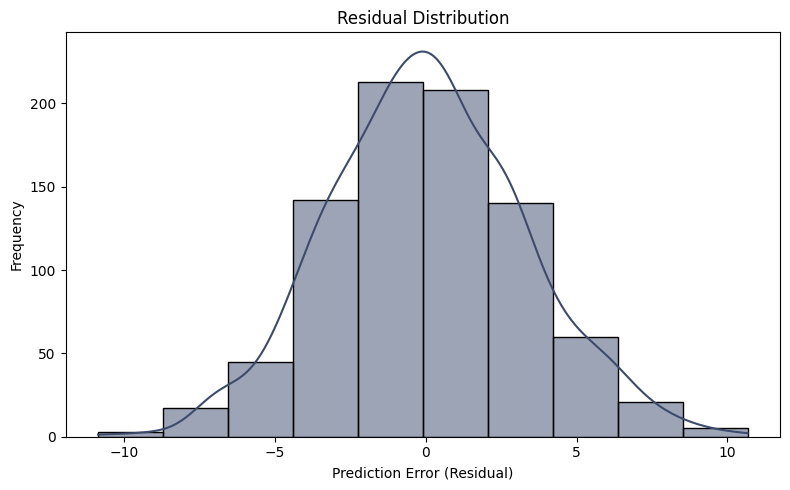

In [41]:
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

y_pred = lr_model.predict(X_test)
residuals = y_test - y_pred

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE:", rmse)

plt.figure(figsize=(8, 5))
sns.histplot(residuals, kde=True, bins=10, color='#3c4b6cff')
plt.title("Residual Distribution")
plt.xlabel("Prediction Error (Residual)")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

In [42]:
df_ols = pd.get_dummies(df, drop_first=True)

X = df_ols.drop(columns=["posttest"])
y = df_ols["posttest"]

X = X.astype(float)
X = sm.add_constant(X)

model = sm.OLS(y, X).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:               posttest   R-squared:                       0.947
Model:                            OLS   Adj. R-squared:                  0.947
Method:                 Least Squares   F-statistic:                     4785.
Date:                Sun, 11 May 2025   Prob (F-statistic):               0.00
Time:                        23:37:38   Log-Likelihood:                -5511.6
No. Observations:                2133   AIC:                         1.104e+04
Df Residuals:                    2124   BIC:                         1.109e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

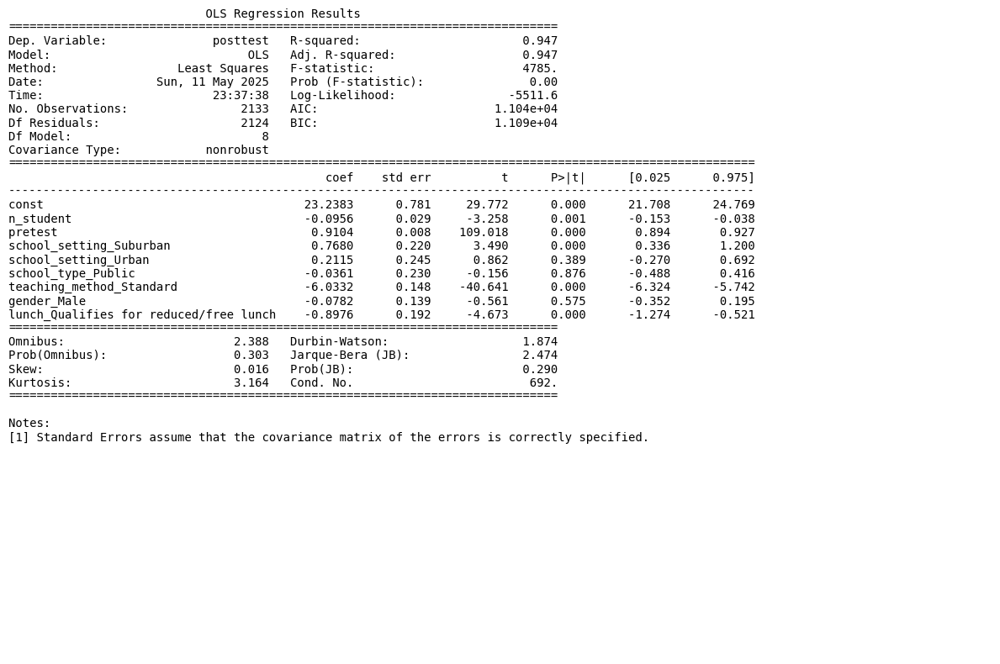

In [43]:
summary_text = model.summary().as_text()

plt.figure(figsize=(12,8))
plt.text(0, 1, summary_text, fontsize=10, fontfamily='monospace', va='top')
plt.axis('off')
plt.tight_layout()
plt.savefig('ols_summary.png', bbox_inches='tight')
plt.show()

In [44]:
y_pred = model.predict(X)
rmse = np.sqrt(mean_squared_error(y, y_pred))
r2 = r2_score(y, y_pred)

print(f"RMSE: {rmse:.3f}")
print(f"R²: {r2:.3f}")

RMSE: 3.206
R²: 0.947


#KNN

In [45]:
#Use KNN with the scaled data
df = df_encoded
X = df.drop(columns=['posttest'])
y = df['posttest']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)
print("Training Set:", X_train.shape, "Testing Set:", X_test.shape)

Training Set: (1279, 13) Testing Set: (854, 13)


In [46]:
scaler = preprocessing.StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

The optimal number of K Neighbors: 4
RMSE that produces best max depth: 3.9088150243537467
R² that produces best max depth: 0.9243229029512482


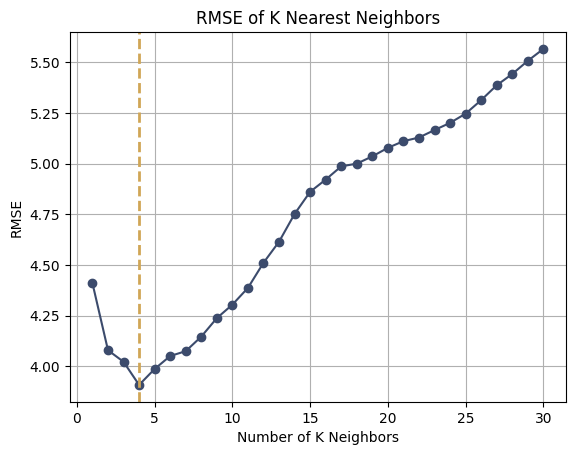

In [47]:
rmse_list = []
k_values = range(1, 31)
r2_list = []

for k in k_values:
  knn = KNeighborsRegressor(n_neighbors=k)
  knn.fit(X_train_scaled, y_train)
  y_pred_knn = knn.predict(X_test_scaled)
  rmse = np.sqrt(mean_squared_error(y_test, y_pred_knn))
  r2 = r2_score(y_test, y_pred_knn)
  r2_list.append(r2)
  rmse_list.append(rmse)

best_index = np.argmin(rmse_list)
best_k = k_values[np.argmin(rmse_list)]
print(f"The optimal number of K Neighbors: {best_k}")
best_rmse = rmse_list[best_index]
print("RMSE that produces best max depth:", best_rmse)
best_r2 = r2_list[best_index]
print("R² that produces best max depth:", best_r2)

best_k = k_values[np.argmin(rmse_list)]


plt.plot(k_values, rmse_list, marker = 'o', color = "#3c4b6cff")
plt.title("RMSE of K Nearest Neighbors")
plt.ylabel("RMSE")
plt.xlabel("Number of K Neighbors")
plt.axvline(best_k, color='#d0a656ff', linestyle='--', linewidth=2, label=f'Best k = {best_k}')
plt.grid(True)
plt.savefig('knn.png', transparent=True)

In [48]:
knn = KNeighborsRegressor(n_neighbors=4)
knn.fit(X_train_scaled, y_train)
y_pred_knn = knn.predict(X_test_scaled)
rmse_knn = np.sqrt(mean_squared_error(y_test, y_pred_knn))
r2_knn = r2_score(y_test, y_pred_knn)

print("RMSE with n = 4:", rmse_knn)
print("R2 with n = 4:", r2_knn)

RMSE with n = 4: 3.9088150243537467
R2 with n = 4: 0.9243229029512482


# Full Decision Tree

In [49]:
X = df.drop(columns=['posttest'])
y = df['posttest']

In [50]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

In [51]:
full_clf = DecisionTreeRegressor(random_state = 42)
full_clf.fit(X_train, y_train)

DecisionTreeRegressor(random_state=42)

In [52]:
print("Number of nodes of Full Tree:", full_clf.tree_.node_count)
print("Depth of Full Tree:", full_clf.get_depth())
print("Number of leaves in Full Tree:", sum(full_clf.tree_.children_left == -1))

Number of nodes of Full Tree: 1775
Depth of Full Tree: 18
Number of leaves in Full Tree: 888


In [53]:

text_fulltree_rep = tree.export_text(full_clf)

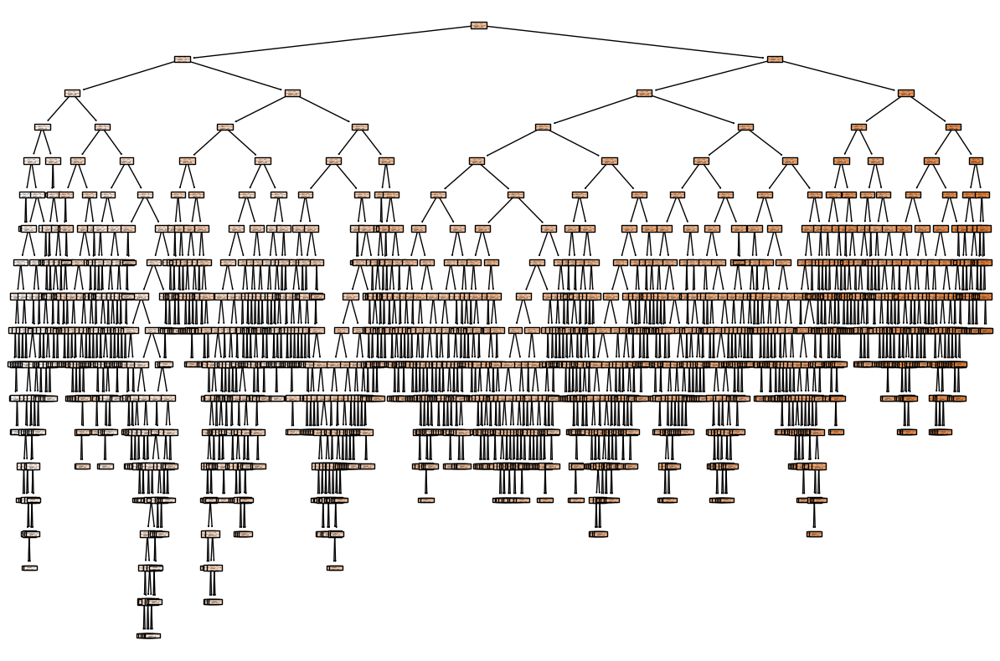

In [54]:
plt.figure(figsize=(15,10))
tree.plot_tree(full_clf, filled=True);
plt.savefig('full_tree.png', transparent=True)

In [55]:
#y_pred_train = full_clf.predict(X_train)
y_pred_test = full_clf.predict(X_test)

In [56]:
rmse_ft = np.sqrt(mean_squared_error(y_test, y_pred_test))
r2_ft = r2_score(y_test, y_pred_test)

print(f"RMSE: {rmse_ft:.3f}")
print(f"R²: {r2_ft:.3f}")

RMSE: 4.283
R²: 0.909


# Pruned Tree

Best max depth: 6
RMSE that produces best max depth: 3.548190250245428
R² that produces best max depth: 0.9376425965677194


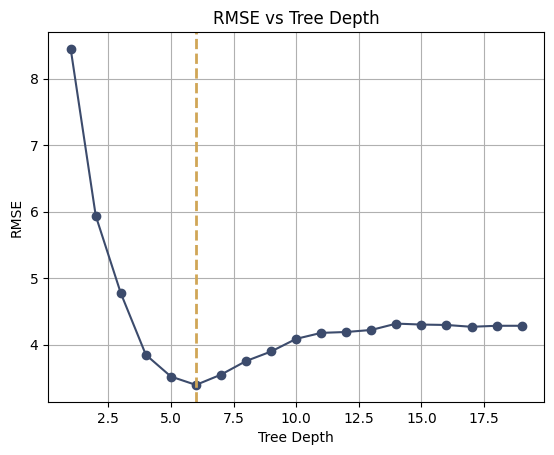

In [57]:
###In decision tree, the best max_depth will be 6, without changing any min_samples_leaf and min_samples_node

depths = range(1, 20)
rmse_list = []
r2_list = []

for d in depths:
    tree = DecisionTreeRegressor(max_depth=d, random_state=42)
    tree.fit(X_train, y_train)
    y_pred = tree.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    rmse_list.append(rmse)
    r2_list.append(r2)

best_index = np.argmin(rmse_list)
best_depth = depths[best_index]
print("Best max depth:", best_depth)
best_rmse = rmse_list[best_depth]
print("RMSE that produces best max depth:", best_rmse)
best_r2 = r2_list[best_depth]
print("R² that produces best max depth:", best_r2)

plt.plot(depths, rmse_list, marker='o', color = '#3c4b6cff')
plt.axvline(x=best_depth, color='#d0a656ff', linewidth=2, linestyle='--', label=f'Best Depth = {best_depth}')
plt.xlabel('Tree Depth')
plt.ylabel('RMSE')
plt.title('RMSE vs Tree Depth')
plt.grid(True)
plt.savefig('tree_depth.png', transparent=True)


Best min_samples_split: 22
RMSE at best min_samples_split: 3.3711244002432923
R² at best min_samples_split: 0.9437109674424728
Leaf nodes at best min_samples_split: 113


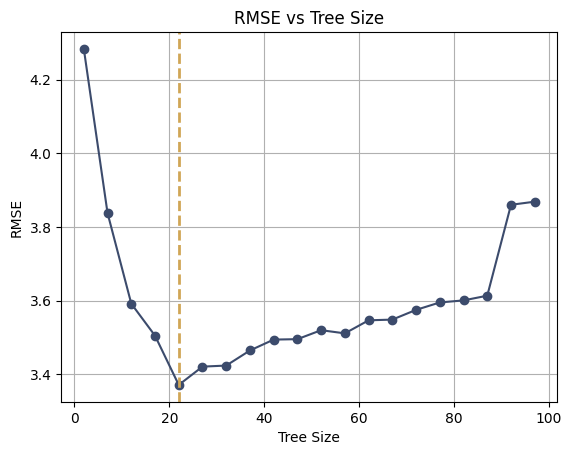

In [58]:
sizes = range(2, 100, 5)
rmse_list = []
r2_list = []
leaf_nodes_list = []

for size in sizes:
    tree = DecisionTreeRegressor(min_samples_split=size, random_state=42)
    tree.fit(X_train, y_train)
    y_pred = tree.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    rmse_list.append(rmse)
    r2_list.append(r2)
    leaf_nodes_list.append(tree.get_n_leaves())

best_index = np.argmin(rmse_list)
best_size = sizes[best_index]

print("Best min_samples_split:", best_size)
best_rmse = rmse_list[best_index]
print("RMSE at best min_samples_split:", best_rmse)
best_r2 = r2_list[best_index]
print("R² at best min_samples_split:", best_r2)
best_leaf_nodes = leaf_nodes_list[best_index]
print("Leaf nodes at best min_samples_split:", best_leaf_nodes)

plt.plot(sizes, rmse_list, marker='o', color='#3c4b6cff')
plt.axvline(x=best_size, color='#d0a656ff', linewidth=2, linestyle='--', label=f'Best Size = {best_size}')
plt.xlabel('Tree Size')
plt.ylabel('RMSE')
plt.title('RMSE vs Tree Size')
plt.grid(True)
plt.savefig('tree_size.png', transparent=True)

Best Leaf Nodes (min_samples_leaf): 12
RMSE at Best Leaf Nodes: 3.416264050507638
R² at Best Leaf Nodes: 0.942193445003742


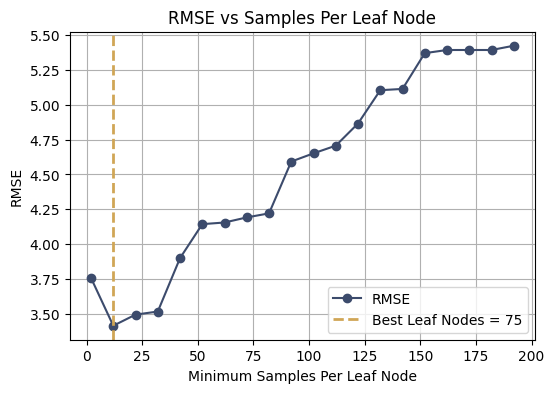

In [59]:
# min_samples_leaf change
leaf_sizes = range(2, 200, 10)
rmse_list = []
r2_list = []
leaf_nodes_list = []

for leaf_size in leaf_sizes:
    tree = DecisionTreeRegressor(min_samples_leaf=leaf_size, random_state=42)
    tree.fit(X_train, y_train)
    y_pred = tree.predict(X_test)

    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    rmse_list.append(rmse)
    r2_list.append(r2)
    leaf_nodes_list.append(tree.get_n_leaves())

# The best leaf node?
best_index = np.argmin(rmse_list)
best_leaf_size = leaf_sizes[best_index]
best_rmse = rmse_list[best_index]
best_r2 = r2_list[best_index]
best_leaf_nodes = leaf_nodes_list[best_index]

# Optimal nodes for each
print("Best Leaf Nodes (min_samples_leaf):", best_leaf_size)
print("RMSE at Best Leaf Nodes:", best_rmse)
print("R² at Best Leaf Nodes:", best_r2)

plt.figure(figsize=(6, 4))
plt.plot(leaf_sizes, rmse_list, marker='o', color='#3c4b6cff', label="RMSE")
plt.axvline(x=best_leaf_size, color='#d0a656ff', linewidth=2, linestyle='--', label=f'Best Leaf Nodes = {best_leaf_nodes}')
plt.xlabel('Minimum Samples Per Leaf Node')
plt.ylabel('RMSE')
plt.title('RMSE vs Samples Per Leaf Node')
plt.grid(True)
plt.legend()
plt.savefig('tree_leaves.png', transparent=True)

In [60]:
reduced_tree = DecisionTreeRegressor(min_samples_split = 22, criterion = 'squared_error', random_state = 42)
reduced_tree.fit(X_train, y_train)

DecisionTreeRegressor(min_samples_split=22, random_state=42)

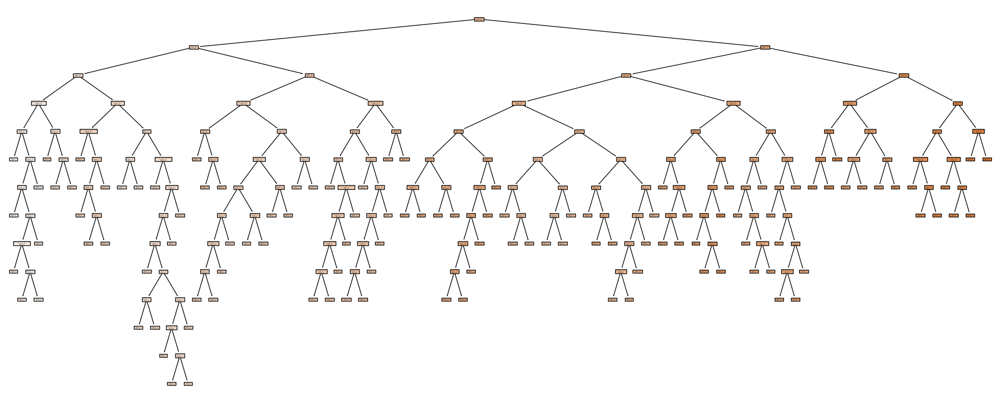

In [61]:
from sklearn.tree import DecisionTreeRegressor, plot_tree
dt_fig = plt.figure(figsize=(25,10))
plot_tree(reduced_tree, feature_names = X.columns, filled=True);
plt.savefig('pruned_tree.png', transparent=True)

In [62]:
viz = dtreeviz.model(reduced_tree,
                     X_train = X_train,
                     y_train = y_train,
                     target_name = 'posttest',
                     feature_names = X.columns)

fig = viz.view(scale=1.8, fontname='DejaVu Sans')
fig

#fig.savefig("decision_tree_visualization.png", transparent=True)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names


In [63]:
y_pred = reduced_tree.predict(X_test)

rmse_dt100 = np.sqrt(mean_squared_error(y_test, y_pred))
r2_dt100 = r2_score(y_test, y_pred)

print(f"Test RMSE: {rmse_dt100:.3f}")
print(f"Test R²: {r2_dt100:.3f}")

Test RMSE: 3.371
Test R²: 0.944


In [64]:
# param range
depths = range(1, 21)
splits = range(10, 51, 10) #min_samp_split
leaf_nodes = range(50, 151, 25)  #min_samp_leaf
impurity_decreases = np.linspace(0.0, 0.05, 6)  #min_impurity_decrease
#What's the best value for each?
best_params = None
best_rmse = float('inf')
results = []
#loop everything
for depth in depths:
    for split in splits:
        for leaf in leaf_nodes:
            for impurity in impurity_decreases:
                reduced_tree = DecisionTreeRegressor(
                    max_depth=depth,
                    min_samples_split=split,
                    min_samples_leaf=leaf,
                    min_impurity_decrease=impurity,
                    criterion='squared_error',
                    random_state=42
                )

                reduced_tree.fit(X_train, y_train)
                y_pred = reduced_tree.predict(X_test)
                #Evaluation
                rmse = np.sqrt(mean_squared_error(y_test, y_pred))
                r2 = r2_score(y_test, y_pred)
                # Save it at results
                results.append((depth, split, leaf, impurity, rmse, r2))
                if rmse < best_rmse:
                    best_rmse = rmse
                    best_params = (depth, split, leaf, impurity)

print("Best Parameters:")
print(f"- Max Depth: {best_params[0]}")
print(f"- Min Samples Split: {best_params[1]}")
print(f"- Min Samples Leaf: {best_params[2]}")
print(f"- Min Impurity Decrease: {best_params[3]}")
print(f"- Best RMSE: {best_rmse}")

Best Parameters:
- Max Depth: 5
- Min Samples Split: 10
- Min Samples Leaf: 50
- Min Impurity Decrease: 0.0
- Best RMSE: 4.016467322107745


In [65]:
reduced_tree_best = DecisionTreeRegressor(max_depth = 5, min_samples_split = 10, min_samples_leaf = 50, min_impurity_decrease = 0.0, criterion = 'squared_error', random_state = 42)
reduced_tree_best.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=5, min_samples_leaf=50, min_samples_split=10,
                      random_state=42)

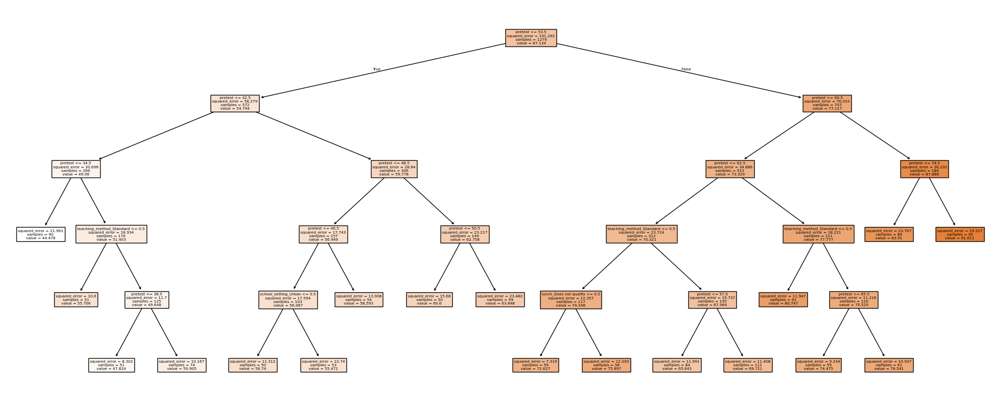

In [66]:
from sklearn.tree import DecisionTreeRegressor, plot_tree
dt_fig_best = plt.figure(figsize=(25,10))
plot_tree(reduced_tree_best, feature_names = X.columns, filled=True);
plt.savefig('pruned_tree_2.png', transparent=True)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names


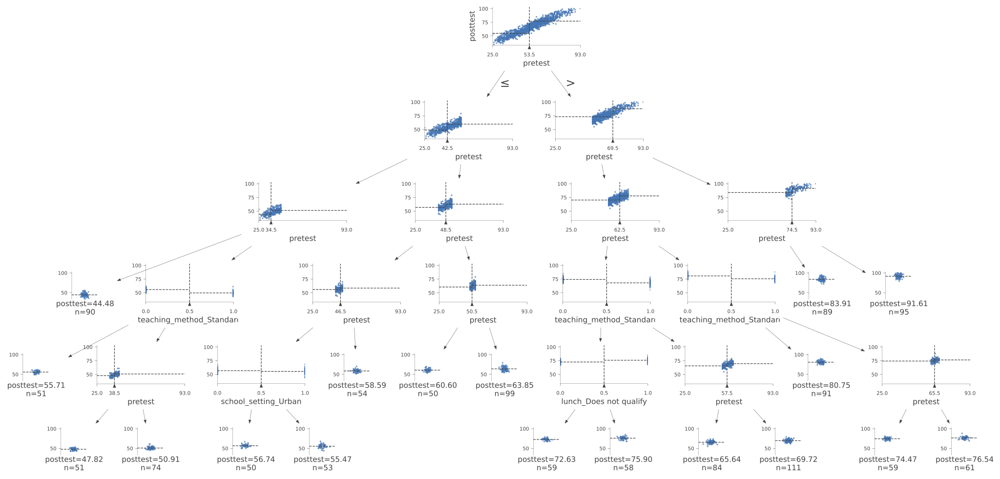

In [67]:
viz = dtreeviz.model(reduced_tree_best,
                     X_train = X_train,
                     y_train = y_train,
                     target_name = 'posttest',
                     feature_names = X.columns)

fig_best = viz.view(scale=1.8, fontname='DejaVu Sans')
fig_best

#fig.savefig("decision_tree_visualization.png", transparent=True)


# Cross Validation (Decision Tree Regressor)

In [68]:
from sklearn.metrics import make_scorer, mean_squared_error

X_scaled
y = df['posttest'].reset_index(drop=True)

In [69]:
fold_options = KFold(n_splits=10, shuffle=True, random_state=0)

rmse_scorer = make_scorer(mean_squared_error, squared=False, greater_is_better=False)
model = DecisionTreeRegressor(max_depth = 6, random_state = 42)
cv_scores = -cross_val_score(model, X_scaled, y, cv=fold_options, scoring='neg_root_mean_squared_error')

print("RMSE scores for each subset:", cv_scores.round(3))
print("Average RMSE:", round(np.mean(cv_scores), 3))

RMSE scores for each subset: [3.551 3.318 3.434 3.132 3.345 3.015 3.425 3.12  3.387 3.366]
Average RMSE: 3.309


In [70]:
fold_options = KFold(n_splits=10, shuffle=True, random_state=0)

rmse_scorer = make_scorer(mean_squared_error, squared=False, greater_is_better=False)
#NEED TO NEGATE
#model = KNeighborsRegressor(n_neighbors=4)
model = DecisionTreeRegressor(max_depth = 10, min_samples_split = 40, min_samples_leaf = 100, min_impurity_decrease = 0.01, criterion = 'squared_error')
cv_scores = -cross_val_score(model, X_scaled, y, cv=fold_options, scoring='neg_root_mean_squared_error')

print("RMSE scores for each subset:", cv_scores.round(3))
print("Average RMSE:", round(np.mean(cv_scores), 3))

RMSE scores for each subset: [4.428 4.157 4.229 4.092 4.172 3.902 4.315 4.309 4.34  4.257]
Average RMSE: 4.22


# XGBoost


XGBoost RMSE: 3.28
XGBoost Test R²: 0.947

Linear Regression Feature Coefficients:
                               Feature  Coefficient
              teaching_method_Standard    -3.049615
          teaching_method_Experimental     3.049615
                               pretest     0.918465
                lunch_Does not qualify     0.359156
lunch_Qualifies for reduced/free lunch    -0.359156
               school_setting_Suburban     0.320402
                  school_setting_Urban    -0.172831
                  school_setting_Rural    -0.147571
                             n_student    -0.077433
                         gender_Female     0.067068
                           gender_Male    -0.067068
                    school_type_Public     0.013703
                school_type_Non-public    -0.013703


<Figure size 8000x8000 with 0 Axes>

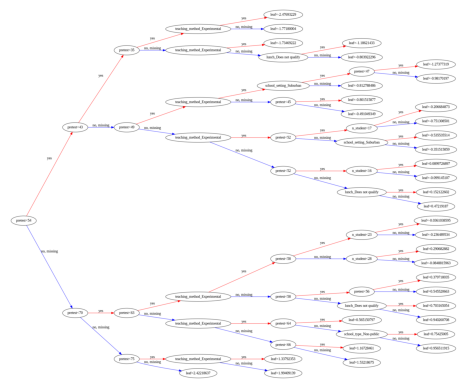

In [71]:
from xgboost import XGBRegressor
from xgboost import plot_tree

X = df.drop(columns=['posttest'])
y = df['posttest']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)
xgb_model = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train, y_train)

# Evaluate
y_pred_xgb = xgb_model.predict(X_test)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_xgb))
r2 = r2_score(y_test, y_pred_xgb)
print(f"XGBoost RMSE: {rmse:.2f}")
print(f"XGBoost Test R²: {r2:.3f}")

# Train with LinearRegression
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)
coef_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Coefficient': lr_model.coef_
}).sort_values(by='Coefficient', key=abs, ascending=False)
print("\nLinear Regression Feature Coefficients:")
print(coef_df.to_string(index=False))

plt.figure(figsize=(80, 80))
plot_tree(xgb_model, num_trees=0, rankdir='LR')
plt.savefig('XGBoost.png', bbox_inches='tight', dpi = 300)
plt.show()


#Random Forest

In [72]:
###### For the feature importances (or random forest and all decision trees), try to use the original dataset which only excludes the student id and irrelevant stuffs
##RESOLVED WITH THE CODE CHEAT USING _ TO ERASE AND COMBINE THE SAME CATEGORIES

In [73]:
X = df.drop(columns=['posttest'])
y = df['posttest']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

In [74]:
rf = RandomForestRegressor(
    n_estimators = 1000,
    random_state = 42,
    criterion = 'squared_error',
    n_jobs = -1
)

rf.fit(X_train, y_train)

RandomForestRegressor(n_estimators=1000, n_jobs=-1, random_state=42)

In [75]:
y_pred_train_rf = rf.predict(X_train)
y_pred_test_rf = rf.predict(X_test)

In [76]:
rmse_rf = np.sqrt(mean_squared_error(y_test, y_pred_test_rf))
r2_rf = r2_score(y_test, y_pred_test_rf)

print(f"RMSE: {rmse_rf:.3f}")
print(f"R²: {r2_rf:.3f}")

RMSE: 3.410
R²: 0.942


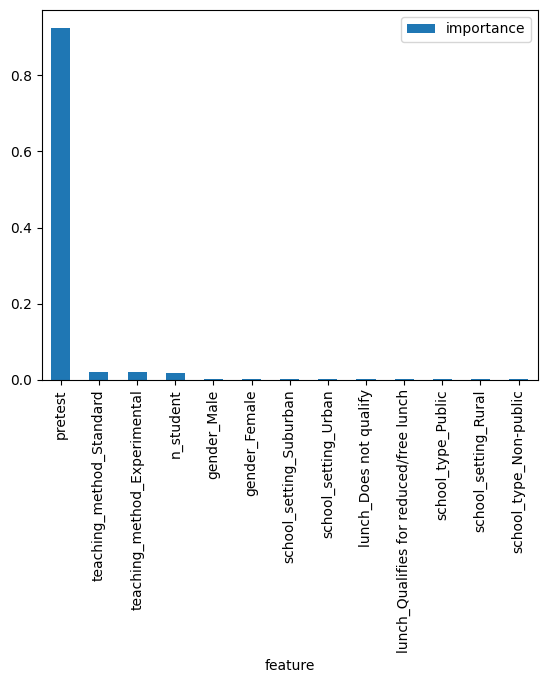

<Figure size 1000x600 with 0 Axes>

In [77]:
important_features = rf.feature_importances_

df_imp_feat = pd.DataFrame({'feature': X_train.columns, 'importance': important_features})

df_imp_feat = df_imp_feat.sort_values('importance', ascending=False)

ax = df_imp_feat.plot(kind = 'bar', x='feature')

plt.figure(figsize=(10, 6))
plt.show()

Text(0.5, 1.0, 'Total Importance for Each Base Feature')

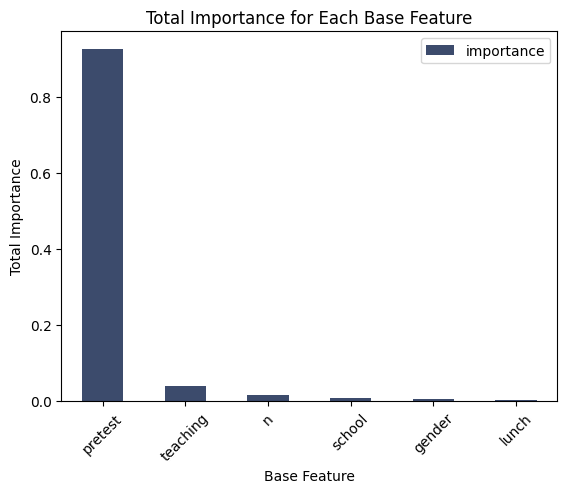

In [78]:
feat_importances = pd.DataFrame({
    'feature': X.columns,
    'importance': rf.feature_importances_
})

feat_importances['base_feature'] = feat_importances['feature'].apply(lambda x: x.split('_')[0])

# Group by categories
grouped_importance = (
    feat_importances
    .groupby('base_feature')
    .agg({'importance': 'sum'})
    .sort_values(by='importance', ascending=False)
)

grouped_importance.plot(kind='bar', color = '#3c4b6cff')
plt.xlabel('Base Feature')
plt.xticks(rotation = 45)
plt.ylabel('Total Importance')
plt.title('Total Importance for Each Base Feature')

#Neural Network

In [79]:
y_nonscaled = df[['posttest']]

X_nonscaled = df.drop(columns=['posttest'])
X_nonscaled.head()

,n_student,pretest,school_setting_Rural,school_setting_Suburban,school_setting_Urban,school_type_Non-public,school_type_Public,teaching_method_Experimental,teaching_method_Standard,gender_Female,gender_Male,lunch_Does not qualify,lunch_Qualifies for reduced/free lunch
0,20.0,62.0,False,False,True,True,False,False,True,True,False,True,False
1,20.0,66.0,False,False,True,True,False,False,True,True,False,True,False
2,20.0,64.0,False,False,True,True,False,False,True,False,True,True,False
3,20.0,61.0,False,False,True,True,False,False,True,True,False,True,False
4,20.0,64.0,False,False,True,True,False,False,True,False,True,True,False


In [80]:
#normalize the variables

scaleOutput = MinMaxScaler()
scaleInput = MinMaxScaler()

y_nn_scaled = scaleOutput.fit_transform(y_nonscaled)
X_nn_scaled = scaleInput.fit_transform(X_nonscaled)

X_train, X_valid, y_train, y_valid = train_test_split(X_nn_scaled, y_nn_scaled, test_size=0.4, random_state=42)

In [81]:
X_train[0,:]

array([0.52941176, 0.70422535, 0.        , 1.        , 0.        ,
       0.        , 1.        , 1.        , 0.        , 1.        ,
       0.        , 1.        , 0.        ])

In [82]:
score_nnet = MLPRegressor(
    hidden_layer_sizes = (10, 5),
    activation = 'relu',
    solver = 'lbfgs',
    random_state = 42
)

score_nnet.fit(X_train, y_train.ravel())

MLPRegressor(hidden_layer_sizes=(10, 5), random_state=42, solver='lbfgs')

In [83]:
y_pred_nn = score_nnet.predict(X_valid)

In [84]:
print('Minimum predicted score:', min(y_pred_nn), "Maximum predicted score:", max(y_pred_nn))

Minimum predicted score: 0.03871711250194643 Maximum predicted score: 0.9988634733424945


In [85]:
y_actual_nn = scaleOutput.inverse_transform(y_valid).ravel()
y_pred_nor = scaleOutput.inverse_transform([score_nnet.predict(X_valid)]).ravel()

In [86]:
print('Minimum predicted score:', min(y_pred_nor), "Maximum predicted score:", max(y_pred_nor))

Minimum predicted score: 34.632763650132354 Maximum predicted score: 99.92271618728962



Regression statistics

                      Mean Error (ME) : -0.0422
       Root Mean Squared Error (RMSE) : 3.2240
            Mean Absolute Error (MAE) : 2.5528
          Mean Percentage Error (MPE) : -0.0411
Mean Absolute Percentage Error (MAPE) : 3.9455


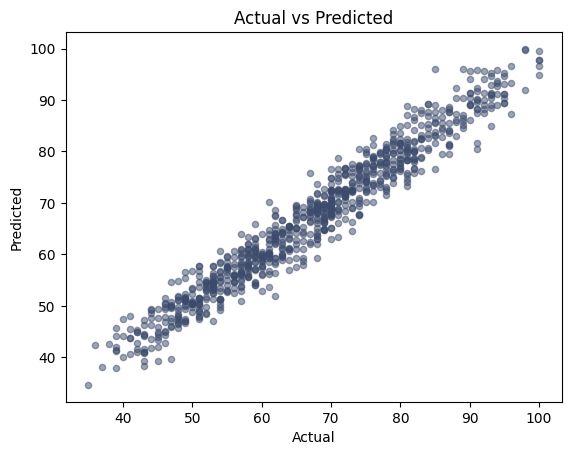

In [87]:
regressionSummary(y_pred_nor, y_actual_nn)

pd.DataFrame({'Actual': y_actual_nn, 'Predicted': y_pred_nor}).plot.scatter(x = 'Actual', y='Predicted', alpha = 0.5, c = "#3c4b6cff")
plt.title("Actual vs Predicted")
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.savefig('actual_vs_predicted_NN.png', transparent=True)

In [88]:
r2 = r2_score(y_actual_nn, y_pred_nor)
print(f"R²: {r2:.3f}")

R²: 0.949


In [89]:
hidden_layers = len(score_nnet.hidden_layer_sizes) if hasattr(score_nnet, 'hidden_layer_sizes') else "Unknown"
hidden_nodes = score_nnet.hidden_layer_sizes if hasattr(score_nnet, 'hidden_layer_sizes') else "Unknown"

print(f"Number of Hidden Layers: {hidden_layers}")
print(f"Nodes per Hidden Layer: {hidden_nodes}")

Number of Hidden Layers: 2
Nodes per Hidden Layer: (10, 5)


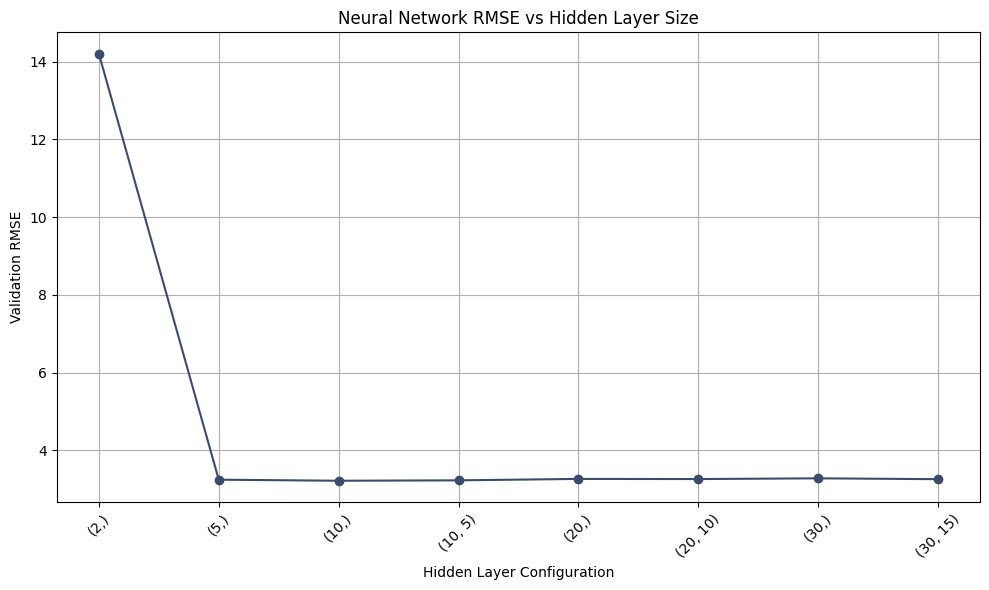

In [90]:
# Depending on # of hidden layers, how will the RMSE change?
hidden_layer_configs = [
    (2,),
    (5,),
    (10,),
    (10, 5),
    (20,),
    (20, 10),
    (30,),
    (30, 15),
]

rmse_list = []

for config in hidden_layer_configs:
    model = MLPRegressor(
        hidden_layer_sizes=config,
        activation='relu',
        solver='lbfgs',
        random_state=42
    )
    model.fit(X_train, y_train.ravel())

    y_pred_nn = model.predict(X_valid)

    y_pred_denorm = scaleOutput.inverse_transform(y_pred_nn.reshape(-1,1)).ravel()
    y_valid_denorm = scaleOutput.inverse_transform(y_valid).ravel()

    rmse = np.sqrt(mean_squared_error(y_valid_denorm, y_pred_denorm))

    rmse_list.append(rmse)

plt.figure(figsize=(10,6))
plt.plot(range(len(hidden_layer_configs)), rmse_list, marker='o', color = '#3c4b6cff')
plt.xticks(range(len(hidden_layer_configs)), [str(cfg) for cfg in hidden_layer_configs], rotation=45)
plt.xlabel('Hidden Layer Configuration')
plt.ylabel('Validation RMSE')
plt.title('Neural Network RMSE vs Hidden Layer Size')
plt.grid(True)
plt.tight_layout()
plt.savefig('nn_hidden_layer.png', transparent=True)

In [91]:
# Depending on # of nodes (for first and second layers), how will the RMSE change?
hidden_layer_configs = [
    (9,), (10,), (11,),
    (10, 4), (10, 5), (10, 6)
]
rmse_list = []

for config in hidden_layer_configs:
    model = MLPRegressor(
        hidden_layer_sizes=config,
        activation='relu',
        solver='lbfgs',
        random_state=42
    )
    model.fit(X_train, y_train.ravel())

    y_pred_nn = model.predict(X_valid)
    y_pred_denorm = scaleOutput.inverse_transform(y_pred_nn.reshape(-1, 1)).ravel()
    y_valid_denorm = scaleOutput.inverse_transform(y_valid).ravel()

    rmse = np.sqrt(mean_squared_error(y_valid_denorm, y_pred_denorm))
    rmse_list.append((config, rmse))

df_results = pd.DataFrame(rmse_list, columns=["Hidden Layer Config", "RMSE"])
print(df_results)

  Hidden Layer Config      RMSE
0                (9,)  3.245878
1               (10,)  3.213437
2               (11,)  3.223652
3             (10, 4)  3.271469
4             (10, 5)  3.224036
5             (10, 6)  3.268047


## Cross-Validation (Neural Network)

In [92]:
kf = KFold(n_splits=5, shuffle=True, random_state=42)

rmse_list = []

for train_index, val_index in kf.split(X_nn_scaled):
    X_train_cv, X_val_cv = X_nn_scaled[train_index], X_nn_scaled[val_index]
    y_train_cv, y_val_cv = y_nn_scaled[train_index], y_nn_scaled[val_index]

    model = MLPRegressor(
        hidden_layer_sizes=(10,5),
        activation='relu',
        solver='lbfgs',
        random_state=42
    )
    model.fit(X_train_cv, y_train_cv.ravel())

    y_pred_cv_norm = model.predict(X_val_cv)
    y_pred_cv = scaleOutput.inverse_transform(y_pred_cv_norm.reshape(-1,1)).ravel()
    y_val_cv_real = scaleOutput.inverse_transform(y_val_cv).ravel()

    rmse = np.sqrt(mean_squared_error(y_val_cv_real, y_pred_cv))
    rmse_list.append(rmse)

    r2 = r2_score(y_val_cv_real, y_pred_cv)
    r2_list.append(r2)

rmse_list = np.array(rmse_list)
r2_list = np.array(r2_list)
print(f"Denormalized Cross-Validation RMSEs: {rmse_list}")
print(f"Average Denormalized RMSE: {rmse_list.mean():.4f}")
print(f"Cross-Validation R^2 Scores: {r2_list}")
print(f"Average R^2 Score: {r2_list.mean():.4f}")

Denormalized Cross-Validation RMSEs: [3.20637953 3.23894344 3.33540236 3.21458652 3.02382253]
Average Denormalized RMSE: 3.2038
Cross-Validation R^2 Scores: [0.93004141 0.94219345 0.93947029 0.93870546 0.92464302 0.9149408
 0.91446162 0.91294901 0.91174683 0.89553574 0.892847   0.8902977
 0.88277105 0.87099475 0.87052825 0.85722112 0.85601936 0.85601936
 0.85601936 0.85437902 0.94888757 0.94819421 0.93771084 0.94911052
 0.95219237]
Average R^2 Score: 0.9059


## Deep Learning with 3 hidden layers, with 256, 128, and 64 nodes

In [93]:
deep_model = MLPRegressor(
    hidden_layer_sizes=(256, 128, 64),
    activation='relu',
    solver='lbfgs',
    max_iter=1000,
    random_state=42
)

In [94]:
deep_model.fit(X_train, y_train)

y_actual_dl = scaleOutput.inverse_transform(y_valid).ravel()
y_pred_dl = scaleOutput.inverse_transform([score_nnet.predict(X_valid)]).ravel()

regressionSummary(y_pred_dl, y_actual_dl)

/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1650: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Regression statistics

                      Mean Error (ME) : -0.0422
       Root Mean Squared Error (RMSE) : 3.2240
            Mean Absolute Error (MAE) : 2.5528
          Mean Percentage Error (MPE) : -0.0411
Mean Absolute Percentage Error (MAPE) : 3.9455


In [95]:
score_nnet_222 = MLPRegressor(hidden_layer_sizes = (2, 2, 2), activation = 'relu', solver = 'lbfgs', random_state = 42)
score_nnet_222.fit(X_train, y_train)

print('\n Validation Data of 3 Hidden Layers and 2 Nodes')
y_actual_dl = scaleOutput.inverse_transform(y_valid).ravel()
y_pred_dl = scaleOutput.inverse_transform([score_nnet.predict(X_valid)]).ravel()

regressionSummary(y_pred_dl, y_actual_dl)


 Validation Data of 3 Hidden Layers and 2 Nodes

Regression statistics

                      Mean Error (ME) : -0.0422
       Root Mean Squared Error (RMSE) : 3.2240
            Mean Absolute Error (MAE) : 2.5528
          Mean Percentage Error (MPE) : -0.0411
Mean Absolute Percentage Error (MAPE) : 3.9455


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:1650: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().


#Model Evaluation

            Model     RMSE      MAE       R²
   Neural Network 3.224036 2.552846 0.948516
Linear Regression 3.240445 2.563732 0.947990
          XGBoost 3.283778 2.591021 0.946590
    Random Forest 3.409589 2.698542 0.942419
     Reduced Tree 4.016467 3.182827 0.920097
    Decision Tree 4.283470 3.358665 0.909121


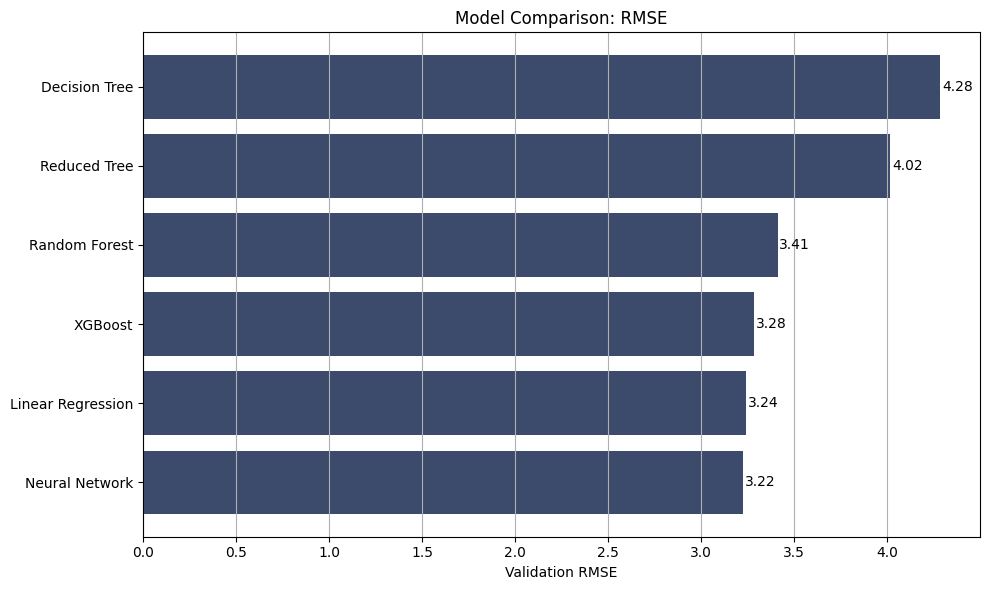

In [96]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np

models = {
    'XGBoost': xgb_model,
    'Random Forest': rf,
    'Decision Tree': full_clf,
    'Reduced Tree': reduced_tree_best,
    'Linear Regression': lr_model,
    'Neural Network': score_nnet
}


performance_list = []

for name, model in models.items():
    if name == 'Neural Network':
        y_pred_nn = model.predict(X_valid)
        y_pred = scaleOutput.inverse_transform(y_pred_nn.reshape(-1,1)).ravel()
        y_true = scaleOutput.inverse_transform(y_valid).ravel()
    else:
        y_pred = model.predict(X_test)
        y_true = y_test

    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    performance_list.append({
        'Model': name,
        'RMSE': rmse,
        'MAE': mae,
        'R²': r2
    })


performance_df = pd.DataFrame(performance_list)
performance_df = performance_df.sort_values(by='RMSE')
print(performance_df.to_string(index=False))


import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.barh(performance_df['Model'], performance_df['RMSE'], color="#3c4b6cff")
bars = plt.barh(performance_df['Model'], performance_df['RMSE'], color="#3c4b6cff")
plt.xlabel('Validation RMSE')
plt.title('Model Comparison: RMSE')
plt.grid(True, axis='x')
plt.tight_layout()
for bar in bars:
    width = bar.get_width()
    plt.text(width + 0.01,
             bar.get_y() + bar.get_height()/2,
             f'{width:.2f}',
             va='center')
plt.savefig('RMSE Summary for models.png', transparent=True)
plt.show()

#Pretest has significantly more influence on our target variable than any other variable. What happens when we get rid of pretest in our feature set?

# Excluding "pretest" from feature set

In [97]:
#When the target_col is 'posttest'
df = df_encoded
target_col = "posttest"

X = df.drop(columns = ['posttest', 'pretest'])
y = df[target_col]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state = 42)

model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

coef_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Coefficient': model.coef_
}).sort_values(by='Coefficient', key=abs, ascending=False)
print("\nFeature Coefficients:")
print(coef_df.to_string(index=False))

print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

print("\nFirst few rows of X_train:")
print(X_train.head())

print("\nFirst few rows of y_train:")
print(y_train.head())

print(f"Test MSE: {mse:.3f}")
print(f"Test R²: {r2:.3f}")


Feature Coefficients:
                               Feature  Coefficient
               school_setting_Suburban     6.762906
lunch_Qualifies for reduced/free lunch    -6.314221
                lunch_Does not qualify     6.314221
                  school_setting_Rural    -3.593431
              teaching_method_Standard    -3.534105
          teaching_method_Experimental     3.534105
                  school_setting_Urban    -3.169475
                school_type_Non-public     2.554204
                    school_type_Public    -2.554204
                             n_student    -0.578679
                         gender_Female    -0.019096
                           gender_Male     0.019096
X_train shape: (1279, 12)
X_test shape: (854, 12)
y_train shape: (1279,)
y_test shape: (854,)

First few rows of X_train:
      n_student  school_setting_Rural  school_setting_Suburban  \
1573       23.0                 False                     True   
1898       25.0                 False          

In [98]:
numeric_cols = X_train.select_dtypes(include=['int64', 'float64']).columns

scaler = StandardScaler()
X_train_scaled = X_train.copy()
X_test_scaled = X_test.copy()

X_train_scaled[numeric_cols] = scaler.fit_transform(X_train[numeric_cols])
X_test_scaled[numeric_cols] = scaler.transform(X_test[numeric_cols])

print("Scaled X_train:")
print(X_train_scaled.head())

Scaled X_train:
      n_student  school_setting_Rural  school_setting_Suburban  \
1573   0.049268                 False                     True   
1898   0.526645                 False                    False   
1435  -0.428109                 False                     True   
1288  -0.189421                 False                    False   
1963   0.287957                 False                     True   

      school_setting_Urban  school_type_Non-public  school_type_Public  \
1573                 False                   False                True   
1898                  True                   False                True   
1435                 False                   False                True   
1288                  True                   False                True   
1963                 False                   False                True   

      teaching_method_Experimental  teaching_method_Standard  gender_Female  \
1573                          True                     False   

In [99]:
y_pred_naive = [y_train.mean()] * len(y_test)
#y_pred_naive = np.full_like(y_test, y_train.mean())
rmse_naive = np.sqrt(mean_squared_error(y_test, y_pred_naive))
print("Naive Baseline RMSE:", rmse_naive)

Naive Baseline RMSE: 14.20919721438681


# PCA without "pretest"

In [100]:
df_pre_drop = df.drop(columns=['pretest'])

pcs = PCA(n_components=7)

pcs.fit(df_pre_drop)

PCA(n_components=7)

In [101]:
print(pcs.explained_variance_ratio_.round(3))

print(np.cumsum(pcs.explained_variance_ratio_).round(3))

[0.93  0.061 0.002 0.002 0.002 0.001 0.001]
[0.93  0.991 0.993 0.995 0.997 0.999 1.   ]


In [102]:
pcsSummary_df = pd.DataFrame({
    "& of variance explained:": pcs.explained_variance_ratio_,
    "Cumulative % explained:": np.cumsum(pcs.explained_variance_ratio_)
})

pcsSummary_df.round(3)

,& of variance explained:,Cumulative % explained:
0,0.930,0.930
1,0.061,0.991
2,0.002,0.993
3,0.002,0.995
4,0.002,0.997
5,0.001,0.999
6,0.001,1.000


In [103]:
pcs.components_.round(3)

array([[-0.161,  0.986, -0.003,  0.015, -0.012,  0.012, -0.012,  0.01 ,
        -0.01 , -0.   ,  0.   ,  0.021, -0.021],
       [ 0.981,  0.162, -0.06 ,  0.009,  0.051, -0.049,  0.049,  0.01 ,
        -0.01 ,  0.003, -0.003, -0.007,  0.007],
       [ 0.004,  0.   ,  0.068, -0.033, -0.035, -0.044,  0.044,  0.094,
        -0.094, -0.697,  0.697, -0.013,  0.013],
       [-0.001,  0.001, -0.066,  0.01 ,  0.056, -0.11 ,  0.11 , -0.597,
         0.597, -0.085,  0.085,  0.347, -0.347],
       [ 0.005, -0.005, -0.196, -0.408,  0.604,  0.426, -0.426,  0.061,
        -0.061, -0.037,  0.037,  0.169, -0.169],
       [-0.004, -0.012,  0.342, -0.345,  0.004, -0.302,  0.302,  0.286,
        -0.286,  0.074, -0.074,  0.451, -0.451],
       [-0.022, -0.036, -0.534,  0.611, -0.077,  0.058, -0.058,  0.22 ,
        -0.22 , -0.019,  0.019,  0.339, -0.339]])

In [104]:
pcs_df = pd.DataFrame(pcs.components_).round(2).transpose()
pcs_df

,0,1,2,3,4,5,6
0,-0.16,0.98,0.00,-0.00,0.01,-0.00,-0.02
1,0.99,0.16,0.00,0.00,-0.01,-0.01,-0.04
2,-0.00,-0.06,0.07,-0.07,-0.20,0.34,-0.53
3,0.02,0.01,-0.03,0.01,-0.41,-0.35,0.61
4,-0.01,0.05,-0.04,0.06,0.60,0.00,-0.08
5,0.01,-0.05,-0.04,-0.11,0.43,-0.30,0.06
6,-0.01,0.05,0.04,0.11,-0.43,0.30,-0.06
7,0.01,0.01,0.09,-0.60,0.06,0.29,0.22
8,-0.01,-0.01,-0.09,0.60,-0.06,-0.29,-0.22
9,-0.00,0.00,-0.70,-0.08,-0.04,0.07,-0.02


In [105]:
var = list(df_pre_drop.columns)
print(var)

['n_student', 'posttest', 'school_setting_Rural', 'school_setting_Suburban', 'school_setting_Urban', 'school_type_Non-public', 'school_type_Public', 'teaching_method_Experimental', 'teaching_method_Standard', 'gender_Female', 'gender_Male', 'lunch_Does not qualify', 'lunch_Qualifies for reduced/free lunch']


In [106]:
pcs_df.index = [var]
pcs_df

,0,1,2,3,4,5,6
n_student,-0.16,0.98,0.00,-0.00,0.01,-0.00,-0.02
posttest,0.99,0.16,0.00,0.00,-0.01,-0.01,-0.04
school_setting_Rural,-0.00,-0.06,0.07,-0.07,-0.20,0.34,-0.53
school_setting_Suburban,0.02,0.01,-0.03,0.01,-0.41,-0.35,0.61
school_setting_Urban,-0.01,0.05,-0.04,0.06,0.60,0.00,-0.08
school_type_Non-public,0.01,-0.05,-0.04,-0.11,0.43,-0.30,0.06
school_type_Public,-0.01,0.05,0.04,0.11,-0.43,0.30,-0.06
teaching_method_Experimental,0.01,0.01,0.09,-0.60,0.06,0.29,0.22
teaching_method_Standard,-0.01,-0.01,-0.09,0.60,-0.06,-0.29,-0.22
gender_Female,-0.00,0.00,-0.70,-0.08,-0.04,0.07,-0.02


In [107]:
scaled_array = preprocessing.scale(df_pre_drop)
print(scaled_array)

[[-0.66144654  0.35025516 -0.56056481 ... -1.00989423  0.86922699
  -0.86922699]
 [-0.66144654  0.85084479 -0.56056481 ... -1.00989423  0.86922699
  -0.86922699]
 [-0.66144654  0.63630638 -0.56056481 ...  0.9902027   0.86922699
  -0.86922699]
 ...
 [ 1.70379314 -1.15151373 -0.56056481 ... -1.00989423 -1.15044748
   1.15044748]
 [ 1.70379314 -1.00848812 -0.56056481 ...  0.9902027  -1.15044748
   1.15044748]
 [ 1.70379314 -1.36605214 -0.56056481 ...  0.9902027  -1.15044748
   1.15044748]]


In [108]:
scaled_df = pd.DataFrame(scaled_array)
print(scaled_df)

            0         1         2         3         4         5         6   \
0    -0.661447  0.350255 -0.560565 -0.711587  1.163746  1.694445 -1.694445   
1    -0.661447  0.850845 -0.560565 -0.711587  1.163746  1.694445 -1.694445   
2    -0.661447  0.636306 -0.560565 -0.711587  1.163746  1.694445 -1.694445   
3    -0.661447  0.707819 -0.560565 -0.711587  1.163746  1.694445 -1.694445   
4    -0.661447  0.636306 -0.560565 -0.711587  1.163746  1.694445 -1.694445   
...        ...       ...       ...       ...       ...       ...       ...   
2128  1.703793 -0.865463 -0.560565 -0.711587  1.163746 -0.590164  0.590164   
2129  1.703793 -1.509078 -0.560565 -0.711587  1.163746 -0.590164  0.590164   
2130  1.703793 -1.151514 -0.560565 -0.711587  1.163746 -0.590164  0.590164   
2131  1.703793 -1.008488 -0.560565 -0.711587  1.163746 -0.590164  0.590164   
2132  1.703793 -1.366052 -0.560565 -0.711587  1.163746 -0.590164  0.590164   

            7         8         9         10        11        1

In [109]:
pd.DataFrame({
              'mean':scaled_df.mean(),
              'stdev': scaled_df.std()
              }).transpose().round(3)


,0,1,2,3,4,5,6,7,8,9,10,11,12
mean,-0.0,-0.0,0.0,0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,0.0,-0.0,0.0
stdev,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [110]:
pcs = PCA(n_components=7)
pcs.fit(scaled_df)

# view the importance of principal components
pcsSummary_df = pd.DataFrame({
            'Proportion of variance': pcs.explained_variance_ratio_,
            'Cumulative proportion': np.cumsum(pcs.explained_variance_ratio_)
            })
pcsSummary_df.transpose().round(3)

,0,1,2,3,4,5,6
Proportion of variance,0.279,0.157,0.153,0.142,0.126,0.106,0.021
Cumulative proportion,0.279,0.436,0.589,0.731,0.857,0.962,0.983


In [111]:
pd.DataFrame(pcs.components_.transpose(), index=[var]).round(2)

,0,1,2,3,4,5,6
n_student,-0.40,0.02,0.05,0.01,-0.41,0.01,-0.02
posttest,0.44,0.02,-0.06,-0.12,-0.17,0.07,0.85
school_setting_Rural,0.01,-0.19,-0.00,-0.19,0.58,-0.46,0.07
school_setting_Suburban,0.20,0.04,-0.11,-0.37,-0.14,0.62,-0.24
school_setting_Urban,-0.20,0.12,0.11,0.52,-0.37,-0.20,0.17
school_type_Non-public,0.34,0.07,0.20,0.44,0.19,0.17,-0.12
school_type_Public,-0.34,-0.07,-0.20,-0.44,-0.19,-0.17,0.12
teaching_method_Experimental,0.20,-0.28,0.50,-0.18,-0.24,-0.16,-0.11
teaching_method_Standard,-0.20,0.28,-0.50,0.18,0.24,0.16,0.11
gender_Female,-0.01,0.61,0.27,-0.20,0.06,-0.10,0.00


In [112]:
eig=pcs.explained_variance_.round(2)
print(eig)

[3.63 2.04 2.   1.85 1.63 1.37 0.27]


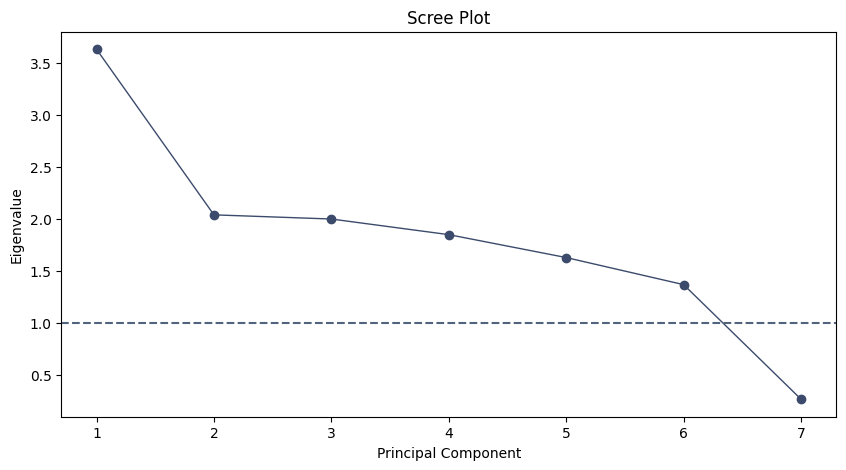

In [113]:
# define the x values, which is a simple array between 1 and 12
xvals = np.arange(1,8,step=1);

plt.figure(figsize=(10,5))
plt.plot(xvals, eig, marker='o', linestyle='-', color = '#3c4b6cff', linewidth=1)
plt.xticks(xvals)

plt.title('Scree Plot')
plt.xlabel('Principal Component')
plt.ylabel('Eigenvalue')
plt.axhline(y=1, color='#52647d', linestyle='--')

In [114]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

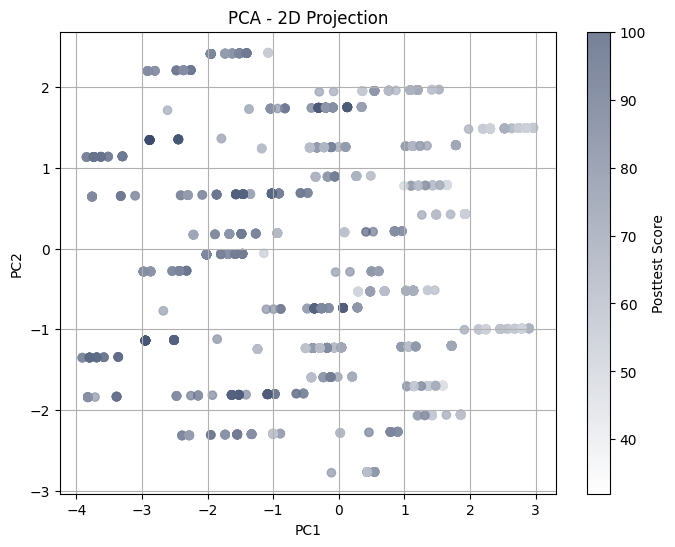

In [115]:
from matplotlib.colors import LinearSegmentedColormap
pca_graph = PCA(n_components=7)
X_pca_graph = pca_graph.fit_transform(X_scaled)

my_cmap = LinearSegmentedColormap.from_list("my_cmap", ['#ffffff', '#3c4b6cff'])

plt.figure(figsize=(8, 6))
plt.scatter(X_pca_graph[:, 0], X_pca_graph[:, 1], c = df['posttest'], cmap = my_cmap, alpha=0.7)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA - 2D Projection')
plt.colorbar(label='Posttest Score')
plt.grid(True)
plt.show()

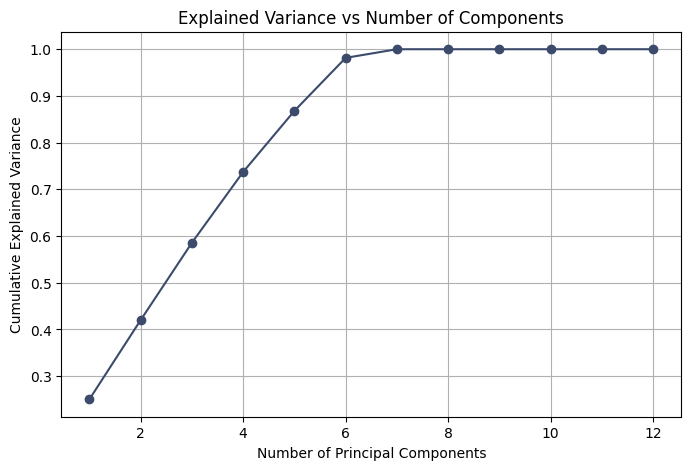

In [116]:
pca_degree = PCA()
X_pca_degree = pca_degree.fit_transform(X_scaled)

cum_var_exp = np.cumsum(pca_degree.explained_variance_ratio_)

plt.figure(figsize=(8,5))
plt.plot(range(1, len(cum_var_exp) + 1), cum_var_exp, marker='o', c = '#3c4b6cff')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance vs Number of Components')
plt.grid(True)
plt.show()

# Prediction Modeling Without X

# Linear Regression



In [117]:
df = pd.read_csv(file_path)
df = df.drop(columns=["school", "classroom", "student_id"])
df = pd.get_dummies(df, drop_first=True)
X = df.drop(columns=["posttest", "pretest"])
y = df["posttest"]

cat_features = X.select_dtypes(include=["object"]).columns.tolist()
num_features = X.select_dtypes(include=["int64", "float64"]).columns.tolist()

preprocessor = ColumnTransformer(transformers=[
    ('num', StandardScaler(), num_features),
    ('cat', OneHotEncoder(handle_unknown='ignore'), cat_features)],
    remainder='passthrough'
)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)
results = {}


RMSE: 8.269914092070033


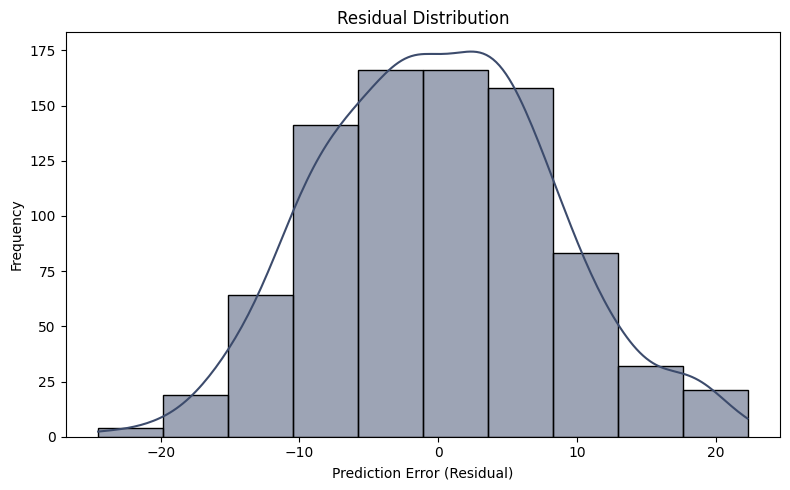

In [118]:
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

y_pred = lr_model.predict(X_test)
residuals = y_test - y_pred

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE:", rmse)

plt.figure(figsize=(8, 5))
sns.histplot(residuals, kde=True, bins=10, color='#3c4b6cff')
plt.title("Residual Distribution")
plt.xlabel("Prediction Error (Residual)")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

In [119]:
X = df.drop(columns=["posttest", "pretest"])
y = df["posttest"]

X = X.astype(float)
X = sm.add_constant(X)

model = sm.OLS(y, X).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:               posttest   R-squared:                       0.653
Model:                            OLS   Adj. R-squared:                  0.652
Method:                 Least Squares   F-statistic:                     572.0
Date:                Sun, 11 May 2025   Prob (F-statistic):               0.00
Time:                        23:40:11   Log-Likelihood:                -7523.5
No. Observations:                2133   AIC:                         1.506e+04
Df Residuals:                    2125   BIC:                         1.511e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

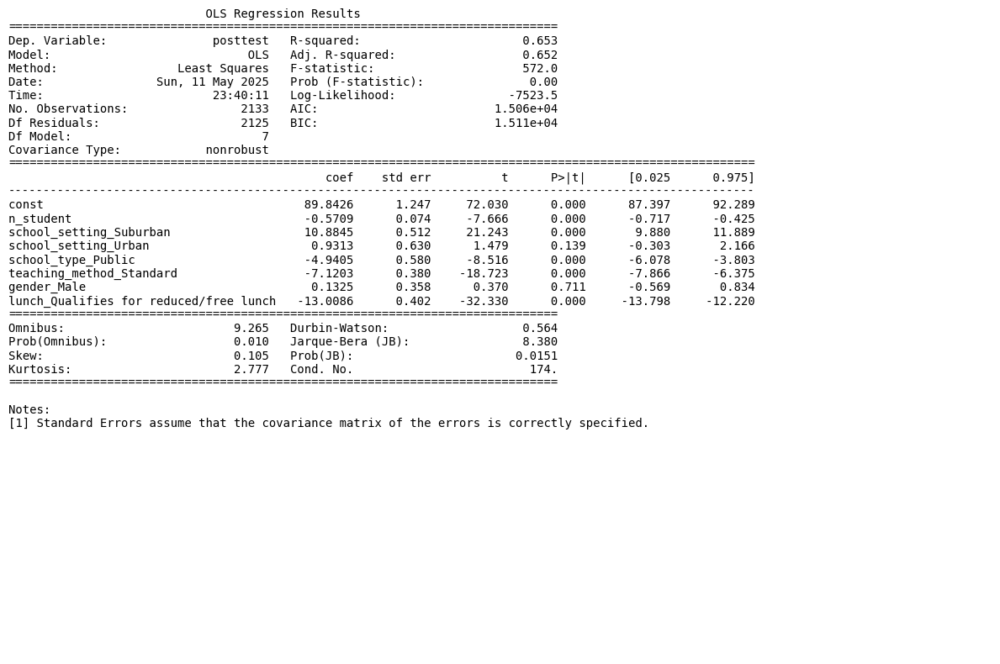

In [120]:
summary_text = model.summary().as_text()

plt.figure(figsize=(12,8))
plt.text(0, 1, summary_text, fontsize=10, fontfamily='monospace', va='top')
plt.axis('off')
plt.tight_layout()
plt.savefig('ols_summary.png', bbox_inches='tight')
plt.show()

In [121]:
y_pred = model.predict(X)
rmse = np.sqrt(mean_squared_error(y, y_pred))
r2 = r2_score(y, y_pred)

print(f"RMSE: {rmse:.3f}")
print(f"R²: {r2:.3f}")

RMSE: 8.234
R²: 0.653


In [122]:
#Use KNN with the scaled data
X = df.drop(columns=['posttest', 'pretest'])
y = df['posttest']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)
print("Training Set:", X_train.shape, "Testing Set:", X_test.shape)

Training Set: (1279, 7) Testing Set: (854, 7)


In [123]:
scaler = preprocessing.StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [124]:
knn = KNeighborsRegressor(n_neighbors=5)
knn.fit(X_train_scaled, y_train)
y_pred_knn = knn.predict(X_test_scaled)
rmse_knn = np.sqrt(mean_squared_error(y_test, y_pred_knn))
r2_knn = r2_score(y_test, y_pred_knn)

print("RMSE with n = 5:", rmse_knn)
print("R2 with n = 5:", r2_knn)

RMSE with n = 5: 6.409031975775323
R2 with n = 5: 0.7965493399535775


#KNN

The optimal number of K Neighbors: 7
RMSE that produces best max depth: 6.37371112236031
R² that produces best max depth: 0.7987856369245387


<function matplotlib.pyplot.figure(num: 'int | str | Figure | SubFigure | None' = None, figsize: 'tuple[float, float] | None' = None, dpi: 'float | None' = None, *, facecolor: 'ColorType | None' = None, edgecolor: 'ColorType | None' = None, frameon: 'bool' = True, FigureClass: 'type[Figure]' = <class 'matplotlib.figure.Figure'>, clear: 'bool' = False, **kwargs) -> 'Figure'>

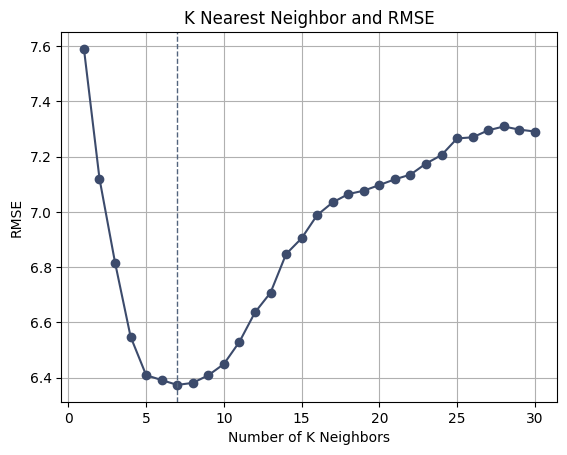

In [125]:
rmse_list = []
k_values = range(1, 31)
r2_list = []

for k in k_values:
  knn = KNeighborsRegressor(n_neighbors=k)
  knn.fit(X_train_scaled, y_train)
  y_pred_knn = knn.predict(X_test_scaled)
  rmse = np.sqrt(mean_squared_error(y_test, y_pred_knn))
  r2 = r2_score(y_test, y_pred_knn)
  r2_list.append(r2)
  rmse_list.append(rmse)

best_index = np.argmin(rmse_list)
best_k = k_values[np.argmin(rmse_list)]
print(f"The optimal number of K Neighbors: {best_k}")
best_rmse = rmse_list[best_index]
print("RMSE that produces best max depth:", best_rmse)
best_r2 = r2_list[best_index]
print("R² that produces best max depth:", best_r2)

best_k = k_values[np.argmin(rmse_list)]


plt.plot(k_values, rmse_list, marker = 'o', color = "#3c4b6cff")
plt.title("K Nearest Neighbor and RMSE")
plt.ylabel("RMSE")
plt.xlabel("Number of K Neighbors")
plt.axvline(best_k, color='#52647d', linestyle='--', linewidth=1, label=f'Best k = {best_k}')
plt.grid(True)
plt.figure

#Decision Trees

In [126]:
X = df.drop(columns=['posttest', 'pretest'])
y = df['posttest']

In [127]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

In [128]:
full_clf = DecisionTreeRegressor(random_state = 42)
full_clf.fit(X_train, y_train)

DecisionTreeRegressor(random_state=42)

In [129]:
print("Number of nodes of Full Tree:", full_clf.tree_.node_count)

Number of nodes of Full Tree: 381


In [133]:
#y_pred_train = full_clf.predict(X_train)
y_pred_test = full_clf.predict(X_test)

In [134]:
rmse_ft = np.sqrt(mean_squared_error(y_test, y_pred_test))
r2_ft = r2_score(y_test, y_pred_test)

print(f"RMSE: {rmse_ft:.3f}")
print(f"R²: {r2_ft:.3f}")

RMSE: 5.359
R²: 0.858


#Pruned Tree

Best max depth: 11
RMSE that produces best max depth: 5.3573285878201915
R² that produces best max depth: 0.8578421668515169


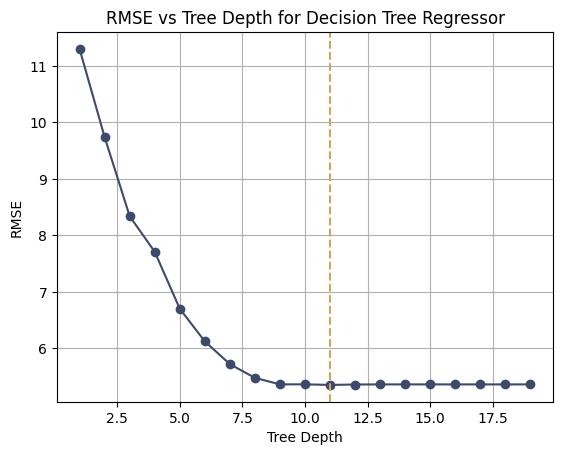

In [135]:
depths = range(1, 20)
rmse_list = []
r2_list = []

for d in depths:
    tree = DecisionTreeRegressor(max_depth=d, random_state=42)
    tree.fit(X_train, y_train)
    y_pred = tree.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    rmse_list.append(rmse)
    r2_list.append(r2)

best_index = np.argmin(rmse_list)
best_depth = depths[best_index]
print("Best max depth:", best_depth)
best_rmse = rmse_list[best_depth]
print("RMSE that produces best max depth:", best_rmse)
best_r2 = r2_list[best_depth]
print("R² that produces best max depth:", best_r2)

plt.plot(depths, rmse_list, marker='o', color = '#3c4b6cff')
plt.axvline(x=best_depth, color='#d0a656ff', linestyle='--', label=f'Best Depth = {best_depth}')
plt.xlabel('Tree Depth')
plt.ylabel('RMSE')
plt.title('RMSE vs Tree Depth for Decision Tree Regressor')
plt.grid(True)
plt.show()

Best Leaf Nodes (min_samples_leaf): 2
RMSE at Best Leaf Nodes: 5.424679521789326
R² at Best Leaf Nodes: 0.8542453568007359


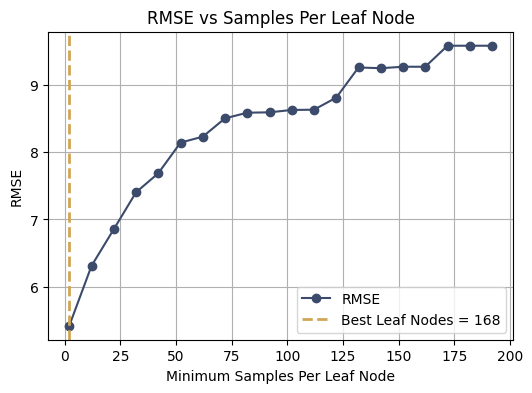

In [136]:
leaf_sizes = range(2, 200, 10)
rmse_list = []
r2_list = []
leaf_nodes_list = []

for leaf_size in leaf_sizes:
    tree = DecisionTreeRegressor(min_samples_leaf=leaf_size, random_state=42)
    tree.fit(X_train, y_train)
    y_pred = tree.predict(X_test)

    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    rmse_list.append(rmse)
    r2_list.append(r2)
    leaf_nodes_list.append(tree.get_n_leaves())

best_index = np.argmin(rmse_list)
best_leaf_size = leaf_sizes[best_index]
best_rmse = rmse_list[best_index]
best_r2 = r2_list[best_index]
best_leaf_nodes = leaf_nodes_list[best_index]

print("Best Leaf Nodes (min_samples_leaf):", best_leaf_size)
print("RMSE at Best Leaf Nodes:", best_rmse)
print("R² at Best Leaf Nodes:", best_r2)
plt.figure(figsize=(6, 4))
plt.plot(leaf_sizes, rmse_list, marker='o', color='#3c4b6cff', label="RMSE")
plt.axvline(x=best_leaf_size, color='#d0a656ff', linewidth=2, linestyle='--', label=f'Best Leaf Nodes = {best_leaf_nodes}')
plt.xlabel('Minimum Samples Per Leaf Node')
plt.ylabel('RMSE')
plt.title('RMSE vs Samples Per Leaf Node')
plt.grid(True)
plt.legend()
plt.savefig('tree_leaves.png', transparent=True)

Best min_samples_split: 7
RMSE at best min_samples_split: 5.358468773038653
R² at best min_samples_split: 0.8577816503065377
Leaf nodes at best min_samples_split: 168


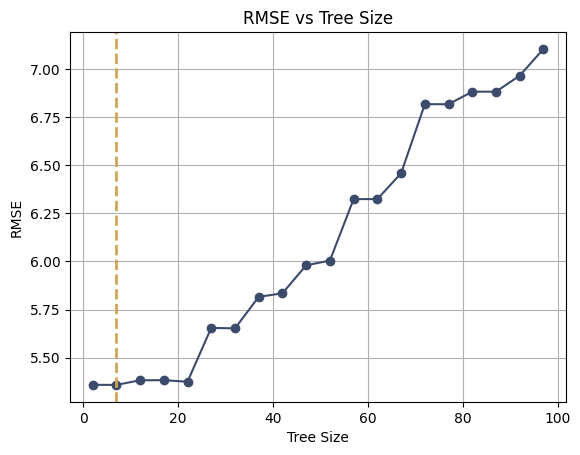

In [137]:
sizes = range(2, 100, 5)
rmse_list = []
r2_list = []
leaf_nodes_list = []

for size in sizes:
    tree = DecisionTreeRegressor(min_samples_split=size, random_state=42)
    tree.fit(X_train, y_train)
    y_pred = tree.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    rmse_list.append(rmse)
    r2_list.append(r2)
    leaf_nodes_list.append(tree.get_n_leaves())

best_index = np.argmin(rmse_list)
best_size = sizes[best_index]

print("Best min_samples_split:", best_size)
best_rmse = rmse_list[best_index]
print("RMSE at best min_samples_split:", best_rmse)
best_r2 = r2_list[best_index]
print("R² at best min_samples_split:", best_r2)
best_leaf_nodes = leaf_nodes_list[best_index]
print("Leaf nodes at best min_samples_split:", best_leaf_nodes)

plt.plot(sizes, rmse_list, marker='o', color='#3c4b6cff')
plt.axvline(x=best_size, color='#d0a656ff', linewidth=2, linestyle='--', label=f'Best Size = {best_size}')
plt.xlabel('Tree Size')
plt.ylabel('RMSE')
plt.title('RMSE vs Tree Size')
plt.grid(True)
plt.savefig('tree_size.png', transparent=True)

In [138]:
reduced_tree = DecisionTreeRegressor(max_depth = 10, min_samples_split = 40, min_samples_leaf = 100, min_impurity_decrease = 0.01, criterion = 'squared_error', random_state = 42)
reduced_tree.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=10, min_impurity_decrease=0.01,
                      min_samples_leaf=100, min_samples_split=40,
                      random_state=42)

Best min_samples_split: 7
RMSE at best min_samples_split: 5.358468773038653
R² at best min_samples_split: 0.8577816503065377
Leaf nodes at best min_samples_split: 168


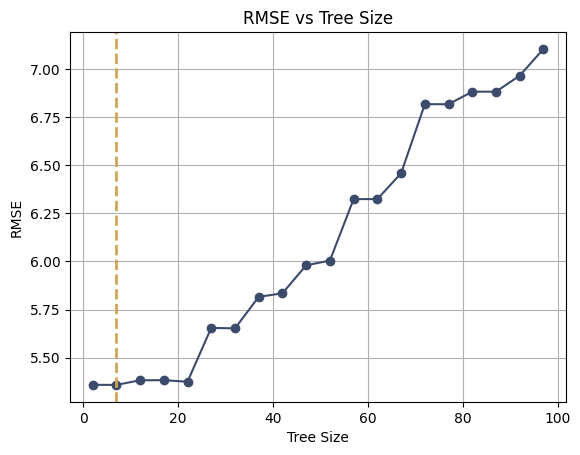

In [139]:
sizes = range(2, 100, 5)
rmse_list = []
r2_list = []
leaf_nodes_list = []

for size in sizes:
    tree = DecisionTreeRegressor(min_samples_split=size, random_state=42)
    tree.fit(X_train, y_train)
    y_pred = tree.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    rmse_list.append(rmse)
    r2_list.append(r2)
    leaf_nodes_list.append(tree.get_n_leaves())

best_index = np.argmin(rmse_list)
best_size = sizes[best_index]

print("Best min_samples_split:", best_size)
best_rmse = rmse_list[best_index]
print("RMSE at best min_samples_split:", best_rmse)
best_r2 = r2_list[best_index]
print("R² at best min_samples_split:", best_r2)
best_leaf_nodes = leaf_nodes_list[best_index]
print("Leaf nodes at best min_samples_split:", best_leaf_nodes)

plt.plot(sizes, rmse_list, marker='o', color='#3c4b6cff')
plt.axvline(x=best_size, color='#d0a656ff', linewidth=2, linestyle='--', label=f'Best Size = {best_size}')
plt.xlabel('Tree Size')
plt.ylabel('RMSE')
plt.title('RMSE vs Tree Size')
plt.grid(True)
plt.savefig('tree_size.png', transparent=True)

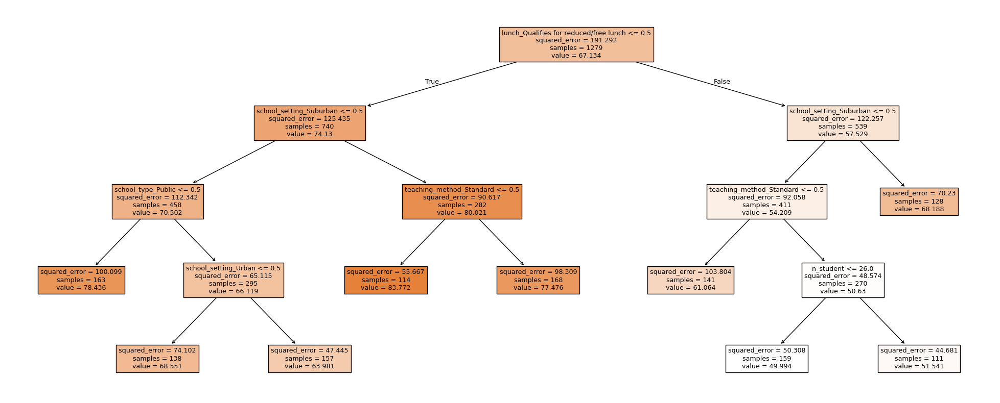

In [140]:
from sklearn.tree import DecisionTreeRegressor
from sklearn import tree
dt_fig = plt.figure(figsize=(25,10))
tree.plot_tree(reduced_tree, feature_names = X.columns, filled=True);

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names


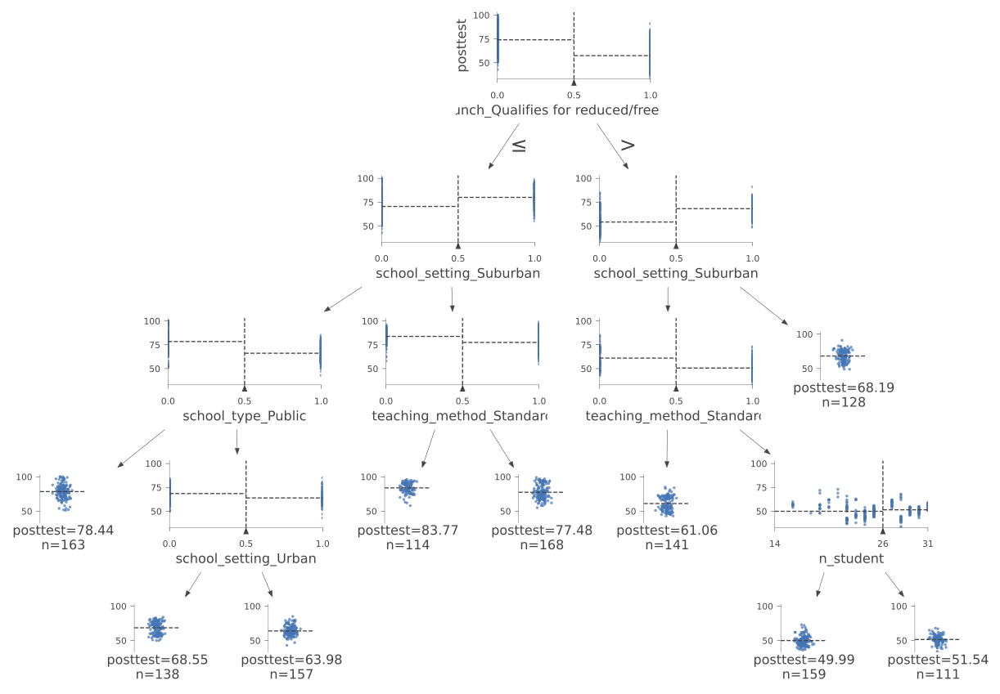

In [141]:
viz = dtreeviz.model(reduced_tree,
                     X_train = X_train,
                     y_train = y_train,
                     target_name = 'posttest',
                     feature_names = X.columns)

viz.view(scale = 1.8, fontname = 'DejaVu Sans')

In [142]:
fold_options = KFold(n_splits=10, shuffle=True, random_state=0)

rmse_scorer = make_scorer(mean_squared_error, squared=False, greater_is_better=False)
model = DecisionTreeRegressor(max_depth = 10, min_samples_split = 40, min_samples_leaf = 100, min_impurity_decrease = 0.01, criterion = 'squared_error')
cv_scores = -cross_val_score(model, X_scaled, y, cv=fold_options, scoring='neg_root_mean_squared_error')

print("RMSE scores for each subset:", cv_scores.round(3))
print("Average RMSE:", round(np.mean(cv_scores), 3))

RMSE scores for each subset: [7.6   9.395 7.894 7.449 8.087 9.04  8.426 8.63  8.441 8.466]
Average RMSE: 8.343


#Random Forest

In [143]:
X = df.drop(columns=['posttest', 'pretest'])
y = df['posttest']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

In [144]:
rf = RandomForestRegressor(
    n_estimators = 1000,
    random_state = 42,
    criterion = 'squared_error',
    n_jobs = -1
)

rf.fit(X_train, y_train)

RandomForestRegressor(n_estimators=1000, n_jobs=-1, random_state=42)

In [145]:
y_pred_train_rf = rf.predict(X_train)
y_pred_test_rf = rf.predict(X_test)

In [146]:
rmse_rf = np.sqrt(mean_squared_error(y_test, y_pred_test_rf))
r2_rf = r2_score(y_test, y_pred_test_rf)

print(f"RMSE: {rmse_rf:.3f}")
print(f"R²: {r2_rf:.3f}")

RMSE: 5.462
R²: 0.852


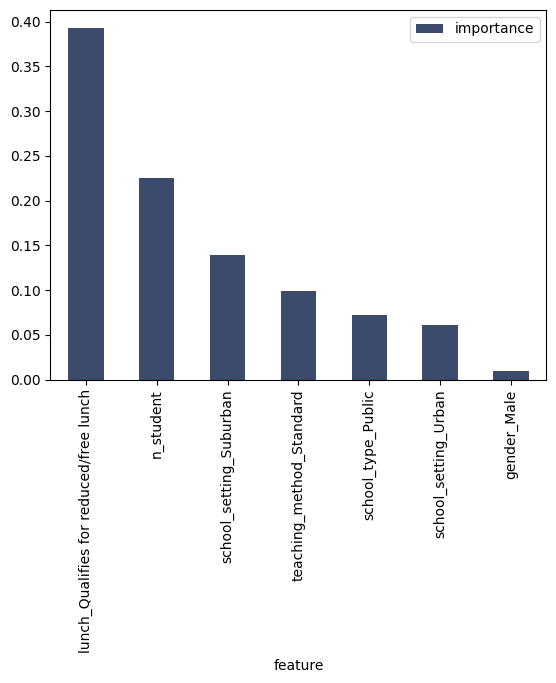

<Figure size 1000x600 with 0 Axes>

In [147]:
important_features = rf.feature_importances_

df_imp_feat = pd.DataFrame({'feature': X_train.columns, 'importance': important_features})

df_imp_feat = df_imp_feat.sort_values('importance', ascending=False)

ax = df_imp_feat.plot(kind = 'bar', x='feature', color = '#3c4b6cff')

plt.figure(figsize=(10, 6))
plt.show()

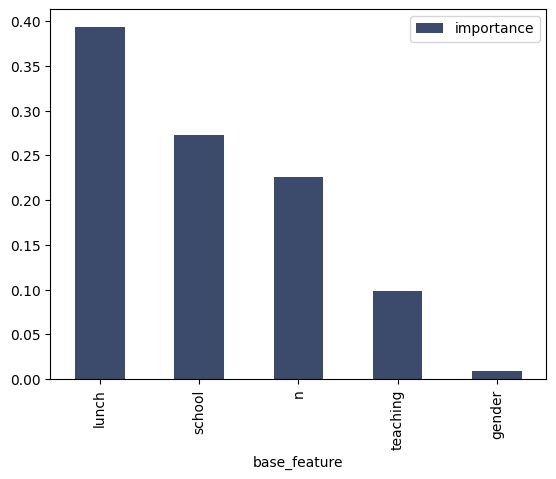

In [148]:
feat_importances = pd.DataFrame({
    'feature': X.columns,
    'importance': rf.feature_importances_
})

feat_importances['base_feature'] = feat_importances['feature'].apply(lambda x: x.split('_')[0])
grouped_importance = (
    feat_importances
    .groupby('base_feature')
    .agg({'importance': 'sum'})
    .sort_values(by='importance', ascending=False)
)

grouped_importance.plot(kind='bar', color = '#3c4b6cff')
plt.savefig('features2.png', transparent=True)

#Neural Network

In [149]:
y_nonscaled = df[['posttest']]

X_nonscaled = df.drop(columns=['posttest', 'pretest'])
X_nonscaled.head()

,n_student,school_setting_Suburban,school_setting_Urban,school_type_Public,teaching_method_Standard,gender_Male,lunch_Qualifies for reduced/free lunch
0,20.0,False,True,False,True,False,False
1,20.0,False,True,False,True,False,False
2,20.0,False,True,False,True,True,False
3,20.0,False,True,False,True,False,False
4,20.0,False,True,False,True,True,False


In [150]:
scaleOutput = MinMaxScaler()
scaleInput = MinMaxScaler()

y_nn_scaled = scaleOutput.fit_transform(y_nonscaled)
X_nn_scaled = scaleInput.fit_transform(X_nonscaled)

X_train, X_valid, y_train, y_valid = train_test_split(X_nn_scaled, y_nn_scaled, test_size=0.4, random_state=42)

In [151]:
X_train[0,:]

array([0.52941176, 1.        , 0.        , 1.        , 0.        ,
       0.        , 0.        ])

In [152]:
score_nnet = MLPRegressor(
    hidden_layer_sizes = (2),
    activation = 'logistic',
    solver = 'lbfgs',
    random_state = 42
)

score_nnet.fit(X_train, y_train.ravel())

MLPRegressor(activation='logistic', hidden_layer_sizes=2, random_state=42,
             solver='lbfgs')

In [153]:
y_pred_nn = score_nnet.predict(X_valid)

In [154]:
print('Minimum predicted score:', min(y_pred_nn), "Maximum predicted score:", max(y_pred_nn))

Minimum predicted score: 0.2565089031722479 Maximum predicted score: 0.866374988745937


In [155]:
y_actual_nn = scaleOutput.inverse_transform(y_valid).ravel()
y_pred_nn = scaleOutput.inverse_transform([score_nnet.predict(X_valid)]).ravel()

In [156]:
print('Minimum predicted score:', min(y_pred_nn), "Maximum predicted score:", max(y_pred_nn))

Minimum predicted score: 49.44260541571286 Maximum predicted score: 90.91349923472372
